In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
!pip install yfinance

     |████████████████████████████████| 6.4 MB 6.5 MB/s 
  Attempting uninstall: lxml
    Found existing installation: lxml 4.2.6
    Uninstalling lxml-4.2.6:
      Successfully uninstalled lxml-4.2.6


In [ ]:
import yfinance as yf
import pandas as pd
import numpy as np
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import pylab
from matplotlib import pyplot
%matplotlib inline

In [ ]:
data = yf.download('AMZN',
                   start='2020-06-01',
                   interval='1h',
                   end='2021-06-01',
                   progress=False)[['Close']]
data

,Close
2020-06-01 09:30:00-04:00,2472.007568
2020-06-01 10:30:00-04:00,2461.639893
2020-06-01 11:30:00-04:00,2468.232910
2020-06-01 12:30:00-04:00,2470.982422
2020-06-01 13:30:00-04:00,2467.334961
...,...
2021-05-28 11:30:00-04:00,3244.459961
2021-05-28 12:30:00-04:00,3231.000000
2021-05-28 13:30:00-04:00,3230.409912
2021-05-28 14:30:00-04:00,3232.741211


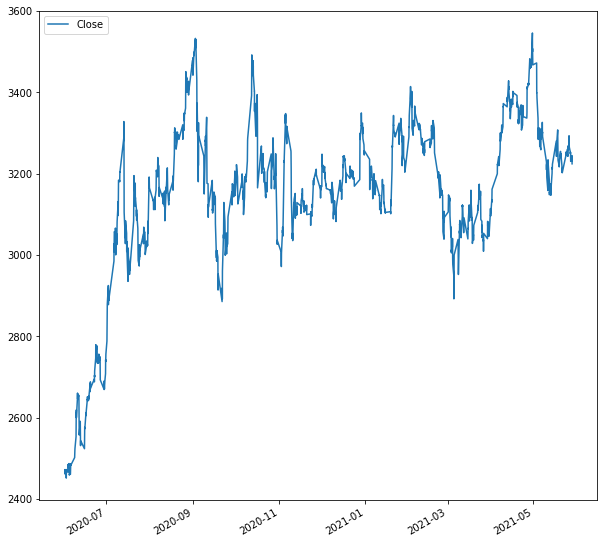

In [ ]:
data.plot(figsize=(10,10))

In [ ]:
def process_data(data, lb):
    X,Y = [], []
    for i in range(len(data) - lb - 1):
        X.append(data[i:(i + lb), 0])
        Y.append(data[(i + lb), 0])
    return np.array(X), np.array(Y)

In [ ]:
cl_df = data.Close.astype('float32')

train_scl = cl_df[0:int(len(cl_df)*0.80)]
scl = MinMaxScaler()

#Scale the data
scl.fit(train_scl.values.reshape(-1,1))
cl_df = scl.transform(cl_df.values.reshape(-1,1))
 
step = 10
X, y = process_data(cl_df, step)
X_train, X_validation, X_test_1, X_test_2 = X[:int(X.shape[0] * 0.70)], X[int(X.shape[0] * 0.70):int(X.shape[0] * 0.80)], X[int(X.shape[0] * 0.80):int(X.shape[0] * 0.90)], X[int(X.shape[0] * 0.90):]
y_train, y_validation, y_test_1, y_test_2 = y[:int(y.shape[0] * 0.70)], y[int(y.shape[0] * 0.70):int(y.shape[0] * 0.80)], y[int(y.shape[0] * 0.80):int(y.shape[0] * 0.90)], y[int(y.shape[0] * 0.90):]

# print(X_train)
print(y_train)

[0.01250958 0.01521754 0.01252556 ... 0.76428366 0.7636547  0.7726052 ]


In [ ]:
#Reshape data for (Sample, Timestep, Features) 
X_train = X_train.reshape((X_train.shape[0], X_train.shape[1], 1))
X_validation = X_validation.reshape((X_validation.shape[0], X_validation.shape[1], 1))
X_test_1 = X_test_1.reshape((X_test_1.shape[0], X_test_1.shape[1], 1))
X_test_2 = X_test_2.reshape((X_test_2.shape[0], X_test_2.shape[1], 1))

# print(X_test)

In [ ]:
model_1 = Sequential()

model_1.add(Dense(units=32, input_dim=10, activation='relu'))
model_1.add(Dense(8, activation='relu'))
model_1.add(Dense(1))

model_1.compile(loss='mean_squared_error', optimizer='adam', metrics = ['mse', 'mae'])

In [ ]:
model_2 = Sequential()

model_2.add(Dense(units=32, input_dim=10, activation='relu'))
model_2.add(Dense(8, activation='relu'))
model_2.add(Dense(1))

model_2.layers[0].set_weights([model_1.layers[0].get_weights()[0], model_1.layers[0].get_weights()[1]])
model_2.layers[1].set_weights([model_1.layers[1].get_weights()[0], model_1.layers[1].get_weights()[1]])
model_2.layers[2].set_weights([model_1.layers[2].get_weights()[0], model_1.layers[2].get_weights()[1]])

model_2.compile(loss='mean_squared_error', optimizer='adam', metrics = ['mse', 'mae'])

In [ ]:
random_weights = np.load('/content/gdrive/MyDrive/yield-paper/save_model/random_weights.npy', allow_pickle=True)
# random_weights = [np.random.rand(*w.shape) for w in model_1.get_weights()]

# update
model_1.set_weights(random_weights)
model_2.set_weights(random_weights)

In [ ]:
weights_1 = []
initial_biases_1 = []

for i in range(len(model_1.layers)):
    weights_1.append(model_1.layers[i].get_weights()[0])
    initial_biases_1.append(model_1.layers[i].get_weights()[1])

# print(weights1)
print(initial_biases_1)

[array([0.15940025, 0.71350724, 0.5896902 , 0.6611655 , 0.19235447,
       0.14555109, 0.5802451 , 0.03904494, 0.18861467, 0.7328079 ,
       0.08613548, 0.47286564, 0.835954  , 0.690621  , 0.24087493,
       0.16522425, 0.36184782, 0.36009878, 0.8939895 , 0.00971647,
       0.14861041, 0.72599244, 0.98891383, 0.5936873 , 0.6236701 ,
       0.88022244, 0.45561084, 0.75259835, 0.11090061, 0.10709599,
       0.7597423 , 0.14739928], dtype=float32), array([0.94648314, 0.01053273, 0.7723272 , 0.812626  , 0.8257013 ,
       0.42518672, 0.70408535, 0.33508557], dtype=float32), array([0.5034336], dtype=float32)]


In [ ]:
weights_2 = []
initial_biases_2 = []

for i in range(len(model_2.layers)):
    weights_2.append(model_2.layers[i].get_weights()[0])
    initial_biases_2.append(model_2.layers[i].get_weights()[1])

# print(weights2)
print(initial_biases_2)

[array([0.15940025, 0.71350724, 0.5896902 , 0.6611655 , 0.19235447,
       0.14555109, 0.5802451 , 0.03904494, 0.18861467, 0.7328079 ,
       0.08613548, 0.47286564, 0.835954  , 0.690621  , 0.24087493,
       0.16522425, 0.36184782, 0.36009878, 0.8939895 , 0.00971647,
       0.14861041, 0.72599244, 0.98891383, 0.5936873 , 0.6236701 ,
       0.88022244, 0.45561084, 0.75259835, 0.11090061, 0.10709599,
       0.7597423 , 0.14739928], dtype=float32), array([0.94648314, 0.01053273, 0.7723272 , 0.812626  , 0.8257013 ,
       0.42518672, 0.70408535, 0.33508557], dtype=float32), array([0.5034336], dtype=float32)]


In [ ]:
import tensorflow as tf
from tensorflow import keras


early_stop_callback = keras.callbacks.EarlyStopping(
    monitor='val_loss',
    patience=20,
    mode='min',
    restore_best_weights=True)

In [ ]:
model_1.fit(X_train,
           y_train,
           epochs=500,
           validation_data=(X_validation, y_validation),
           callbacks=[early_stop_callback],
           shuffle=False)

Epoch 1/500
39/39 [==============================] - 1s 7ms/step - loss: 70652.4609 - mse: 70652.4609 - mae: 256.6885 - val_loss: 56679.7109 - val_mse: 56679.7109 - val_mae: 236.1923
Epoch 2/500
39/39 [==============================] - 0s 2ms/step - loss: 46544.8984 - mse: 46544.8984 - mae: 208.2713 - val_loss: 38397.4766 - val_mse: 38397.4766 - val_mae: 194.4026
Epoch 3/500
39/39 [==============================] - 0s 2ms/step - loss: 32252.5918 - mse: 32252.5918 - mae: 173.3293 - val_loss: 27142.9922 - val_mse: 27142.9922 - val_mae: 163.4474
Epoch 4/500
39/39 [==============================] - 0s 2ms/step - loss: 23173.6328 - mse: 23173.6328 - mae: 146.8951 - val_loss: 19788.1738 - val_mse: 19788.1738 - val_mae: 139.5566
Epoch 5/500
39/39 [==============================] - 0s 2ms/step - loss: 17102.6309 - mse: 17102.6309 - mae: 126.1767 - val_loss: 14767.9355 - val_mse: 14767.9355 - val_mae: 120.5606
Epoch 6/500
39/39 [==============================] - 0s 2ms/step - loss: 12886.8340 -

In [ ]:
y_pred_val_mod_1 = model_1.predict(X_validation)
print(mean_squared_error(y_validation, y_pred_val_mod_1))

0.0019553937


In [ ]:
y_pred_test_mod_1 = model_1.predict(X_test_1)
print(mean_squared_error(y_test_1, y_pred_test_mod_1))

0.0019167335


In [ ]:
y_train_disturbed = y_train + 0.01
y_validation_disturbed = y_validation + 0.01

print(y_train)
print(y_validation_disturbed)

[0.01250958 0.01521754 0.01252556 ... 0.76428366 0.7636547  0.7726052 ]
[0.7638345  0.77191067 0.7586076  0.76148486 0.7487552  0.7540746
 0.7595327  0.7437873  0.75760865 0.75151205 0.7496619  0.75290895
 0.75500107 0.77500963 0.78127265 0.7641859  0.7617068  0.77234554
 0.76937723 0.76396394 0.7645285  0.7718458  0.79150414 0.8033366
 0.81180143 0.7988732  0.8019676  0.80222654 0.7813592  0.8047521
 0.80908155 0.8231802  0.81942415 0.82034945 0.82157063 0.8079679
 0.8065469  0.8009498  0.7859354  0.7759166  0.76042104 0.7496803
 0.6928046  0.6982348  0.6906028  0.70641303 0.70117974 0.6880958
 0.6862085  0.657063   0.6471598  0.6606014  0.65346885 0.6617193
 0.6995394  0.69847536 0.6576505  0.66784525 0.663044   0.6660874
 0.6579187  0.65308046 0.6650605  0.6525345  0.6412344  0.61472535
 0.60219026 0.61515546 0.5737245  0.5703571  0.5533259  0.5902653
 0.616668   0.61590004 0.59241176 0.59679675 0.60291076 0.61521554
 0.62212205 0.6312015  0.6337688  0.6429229  0.65405154 0.6531081


In [ ]:
model_2.fit(X_train,
           y_train_disturbed,
           epochs=500,
           validation_data=(X_validation, y_validation_disturbed),
           callbacks=[early_stop_callback],
           shuffle=False)

Epoch 1/500
39/39 [==============================] - 1s 6ms/step - loss: 70647.3906 - mse: 70647.3906 - mae: 256.6786 - val_loss: 56675.0508 - val_mse: 56675.0508 - val_mae: 236.1825
Epoch 2/500
39/39 [==============================] - 0s 2ms/step - loss: 46540.8438 - mse: 46540.8438 - mae: 208.2616 - val_loss: 38393.7227 - val_mse: 38393.7227 - val_mae: 194.3929
Epoch 3/500
39/39 [==============================] - 0s 2ms/step - loss: 32249.3066 - mse: 32249.3066 - mae: 173.3198 - val_loss: 27139.9277 - val_mse: 27139.9277 - val_mae: 163.4380
Epoch 4/500
39/39 [==============================] - 0s 2ms/step - loss: 23170.9316 - mse: 23170.9316 - mae: 146.8858 - val_loss: 19785.6328 - val_mse: 19785.6328 - val_mae: 139.5475
Epoch 5/500
39/39 [==============================] - 0s 2ms/step - loss: 17100.3809 - mse: 17100.3809 - mae: 126.1677 - val_loss: 14765.8135 - val_mse: 14765.8135 - val_mae: 120.5518
Epoch 6/500
39/39 [==============================] - 0s 2ms/step - loss: 12884.9492 -

In [ ]:
def get_delta(model_1, model_2):
  delta_matrix = []

  for i in range(len(model_1.layers)):
    normal_weights = model_1.layers[i].get_weights()[0]
    # print("IN DELTA: NORMAL WEIGHTS")
    # print(normal_weights)

    disturbed_weights = model_2.layers[i].get_weights()[0]
    # print("IN DELTA: DISTURBED WEIGHTS")
    # print(disturbed_weights)
    # print(np.abs(np.divide(np.subtract(disturbed_weights, normal_weights), disturbed_weights)))

    delta_matrix.append(np.abs(np.divide(np.subtract(disturbed_weights, normal_weights), disturbed_weights)))
  return delta_matrix

In [ ]:
class FreezeWeights(keras.callbacks.Callback):
  def __init__(self, mask):
        super(FreezeWeights, self).__init__()
        self.mask = mask

  def on_epoch_end(self, epoch, logs=None):
    for i in range(len(self.model.layers)):
      self.model.layers[i].set_weights([np.multiply(self.model.layers[i].get_weights()[0], self.mask[i]), self.model.layers[i].get_weights()[1]])

In [ ]:
def plot_graph(values, y_label, x_label, color):
  len_prediction=[x for x in range(len(values))]
  plt.figure(figsize=(8,4))
  plt.plot(len_prediction, values, color, linestyle='--')
  plt.ylabel(y_label, size=15)
  plt.xlabel(x_label, size=15)
  plt.show();

In [ ]:
def plot_log_graph(values, y_label, x_label, color):
  len_prediction=[x for x in range(len(values))]
  pyplot.plot(len_prediction, values, color, linestyle='--')
  pyplot.yscale('log')
  plt.ylabel(y_label, size=15)
  plt.xlabel(x_label, size=15)
  pyplot.show()

In [ ]:
def get_model():
  model = Sequential()

  model.add(Dense(units=32, input_dim=10, activation='relu'))
  model.add(Dense(8, activation='relu'))
  model.add(Dense(1))

  model.compile(loss='mean_squared_error', optimizer='adam', metrics = ['mse', 'mae'])
  
  return model

In [ ]:
def reduct(model_1, model_2, weights, initial_biases_1, initial_biases_2):
  mask_matrix = []
  validation_MSE = []
  test_1_MSE = []
  test_2_MSE = []
  deviation = []
  best_model_weights = []
  k = 0

  while(k != 100):
    delta_matrix = get_delta(model_1, model_2)

    converted_delta_matrix = []
    for i in range(len(delta_matrix)):
      delta_matrix[i] = np.nan_to_num(delta_matrix[i])
      converted_delta_matrix.append(np.where(delta_matrix[i] == 0, 1, delta_matrix[i]))
    
    max_elements = []
    min_elements = []

    if k == 0:
      for i in range(len(delta_matrix)):
        mask_matrix.append(np.ones_like(delta_matrix[i]))
    
    for i in range(len(model_1.layers)):
      max_elements.append(np.max(np.asarray(delta_matrix[i])))
      min_elements.append(np.min(np.asarray(converted_delta_matrix[i])))
    
    max_element = np.max(np.asarray(max_elements))
    min_element = np.min(np.asarray(min_elements))
    deviation.append(max_element - min_element)

    max_element_layer_index =  np.unravel_index(np.argmax(np.asarray(max_elements), axis=None),np.asarray(max_elements).shape)[0]
    max_element_indexes= np.unravel_index(np.argmax(delta_matrix[max_element_layer_index], axis=None), delta_matrix[max_element_layer_index].shape)
    mask_matrix[max_element_layer_index][max_element_indexes] = 0
    k += 1

    model_1 = get_model()
    model_2 = get_model()

    for i in range(len(model_1.layers)):
      model_1.layers[i].set_weights([np.multiply(weights[i], mask_matrix[i]), initial_biases_1[i]])
      model_2.layers[i].set_weights([np.multiply(weights[i], mask_matrix[i]), initial_biases_2[i]])
    
    model_1.fit(X_train,
                y_train,
                epochs=500,
                validation_data=(X_validation, y_validation),
                shuffle=False,
                callbacks=[FreezeWeights(mask_matrix), early_stop_callback])
    
    model_2.fit(X_train,
                y_train_disturbed,
                epochs=500,
                validation_data=(X_validation, y_validation_disturbed),
                shuffle=False,
                callbacks=[FreezeWeights(mask_matrix), early_stop_callback])
    
    y_pred_validation = model_1.predict(X_validation)
    validation_MSE.append(mean_squared_error(y_validation, y_pred_validation))

    if validation_MSE[-1] == np.min(validation_MSE):
      best_model_weights = []
      for i in range(len(model_1.layers)):
          best_model_weights.append([model_1.layers[i].get_weights()[0], model_1.layers[i].get_weights()[1]])
    
    y_pred_test_1 = model_1.predict(X_test_1)
    test_1_MSE.append(mean_squared_error(y_test_1, y_pred_test_1))

    y_pred_test_2 = model_1.predict(X_test_2)
    test_2_MSE.append(mean_squared_error(y_test_2, y_pred_test_2))
  
  return validation_MSE, test_1_MSE, test_2_MSE, deviation, best_model_weights


validation_MSE, test_1_MSE, test_2_MSE, deviation, best_model_weights = reduct(model_1, model_2, weights_1, initial_biases_1, initial_biases_2)

Epoch 1/500
39/39 [==============================] - 1s 6ms/step - loss: 70277.7266 - mse: 70277.7266 - mae: 256.0150 - val_loss: 56368.8984 - val_mse: 56368.8984 - val_mae: 235.5455
Epoch 2/500
39/39 [==============================] - 0s 2ms/step - loss: 46313.1406 - mse: 46313.1406 - mae: 207.7591 - val_loss: 38199.5508 - val_mse: 38199.5508 - val_mae: 193.9023
Epoch 3/500
39/39 [==============================] - 0s 2ms/step - loss: 32099.5801 - mse: 32099.5801 - mae: 172.9236 - val_loss: 27009.5918 - val_mse: 27009.5918 - val_mae: 163.0465
Epoch 4/500
39/39 [==============================] - 0s 2ms/step - loss: 23067.5566 - mse: 23067.5566 - mae: 146.5636 - val_loss: 19694.2949 - val_mse: 19694.2949 - val_mae: 139.2262
Epoch 5/500
39/39 [==============================] - 0s 2ms/step - loss: 17026.2988 - mse: 17026.2988 - mae: 125.8993 - val_loss: 14699.6191 - val_mse: 14699.6191 - val_mae: 120.2824
Epoch 6/500
39/39 [==============================] - 0s 2ms/step - loss: 12830.2871 -

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 6ms/step - loss: 70230.5234 - mse: 70230.5234 - mae: 255.9302 - val_loss: 56330.5859 - val_mse: 56330.5859 - val_mae: 235.4657
Epoch 2/500
39/39 [==============================] - 0s 3ms/step - loss: 46292.1562 - mse: 46292.1562 - mae: 207.7126 - val_loss: 38181.1484 - val_mse: 38181.1484 - val_mae: 193.8557
Epoch 3/500
39/39 [==============================] - 0s 2ms/step - loss: 32089.1855 - mse: 32089.1855 - mae: 172.8960 - val_loss: 26999.7012 - val_mse: 26999.7012 - val_mae: 163.0167
Epoch 4/500
39/39 [==============================] - 0s 2ms/step - loss: 23061.5059 - mse: 23061.5059 - mae: 146.5446 - val_loss: 19688.1094 - val_mse: 19688.1094 - val_mae: 139.2044
Epoch 5/500
39/39 [==============================] - 0s 3ms/step - loss: 17021.9902 - mse: 17021.9902 - mae: 125.8835 - val_loss: 14695.0283 - val_mse: 14695.0283 - val_mae: 120.2636
Epoch 6/500
39/39 [==============================] - 0s 3ms/step - loss: 12826.5977 -

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 6ms/step - loss: 70055.6562 - mse: 70055.6562 - mae: 255.6145 - val_loss: 56187.4023 - val_mse: 56187.4023 - val_mae: 235.1668
Epoch 2/500
39/39 [==============================] - 0s 2ms/step - loss: 46187.9336 - mse: 46187.9336 - mae: 207.4810 - val_loss: 38092.8477 - val_mse: 38092.8477 - val_mae: 193.6319
Epoch 3/500
39/39 [==============================] - 0s 2ms/step - loss: 32022.3926 - mse: 32022.3926 - mae: 172.7177 - val_loss: 26941.6992 - val_mse: 26941.6992 - val_mae: 162.8418
Epoch 4/500
39/39 [==============================] - 0s 2ms/step - loss: 23016.2539 - mse: 23016.2539 - mae: 146.4021 - val_loss: 19648.0801 - val_mse: 19648.0801 - val_mae: 139.0630
Epoch 5/500
39/39 [==============================] - 0s 2ms/step - loss: 16989.9648 - mse: 16989.9648 - mae: 125.7660 - val_loss: 14666.2949 - val_mse: 14666.2949 - val_mae: 120.1461
Epoch 6/500
39/39 [==============================] - 0s 2ms/step - loss: 12803.0840 -

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 6ms/step - loss: 69386.3594 - mse: 69386.3594 - mae: 254.3866 - val_loss: 55618.8086 - val_mse: 55618.8086 - val_mae: 233.9728
Epoch 2/500
39/39 [==============================] - 0s 3ms/step - loss: 45754.8477 - mse: 45754.8477 - mae: 206.5026 - val_loss: 37715.6211 - val_mse: 37715.6211 - val_mae: 192.6698
Epoch 3/500
39/39 [==============================] - 0s 2ms/step - loss: 31726.5273 - mse: 31726.5273 - mae: 171.9151 - val_loss: 26679.4258 - val_mse: 26679.4258 - val_mae: 162.0464
Epoch 4/500
39/39 [==============================] - 0s 3ms/step - loss: 22806.2520 - mse: 22806.2520 - mae: 145.7302 - val_loss: 19459.4805 - val_mse: 19459.4805 - val_mae: 138.3933
Epoch 5/500
39/39 [==============================] - 0s 2ms/step - loss: 16836.5801 - mse: 16836.5801 - mae: 125.1948 - val_loss: 14527.1406 - val_mse: 14527.1406 - val_mae: 119.5742
Epoch 6/500
39/39 [==============================] - 0s 2ms/step - loss: 12688.5381 -

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 6ms/step - loss: 69323.5938 - mse: 69323.5938 - mae: 254.2730 - val_loss: 55567.3555 - val_mse: 55567.3555 - val_mae: 233.8648
Epoch 2/500
39/39 [==============================] - 0s 3ms/step - loss: 45724.8320 - mse: 45724.8320 - mae: 206.4357 - val_loss: 37689.3672 - val_mse: 37689.3672 - val_mae: 192.6029
Epoch 3/500
39/39 [==============================] - 0s 2ms/step - loss: 31710.6406 - mse: 31710.6406 - mae: 171.8725 - val_loss: 26664.6602 - val_mse: 26664.6602 - val_mae: 162.0017
Epoch 4/500
39/39 [==============================] - 0s 3ms/step - loss: 22796.7422 - mse: 22796.7422 - mae: 145.7000 - val_loss: 19450.1543 - val_mse: 19450.1543 - val_mae: 138.3601
Epoch 5/500
39/39 [==============================] - 0s 3ms/step - loss: 16830.0098 - mse: 16830.0098 - mae: 125.1705 - val_loss: 14520.4365 - val_mse: 14520.4365 - val_mae: 119.5466
Epoch 6/500
39/39 [==============================] - 0s 2ms/step - loss: 12683.2920 -

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 6ms/step - loss: 68693.3594 - mse: 68693.3594 - mae: 253.1121 - val_loss: 55033.5039 - val_mse: 55033.5039 - val_mae: 232.7380
Epoch 2/500
39/39 [==============================] - 0s 2ms/step - loss: 45317.8281 - mse: 45317.8281 - mae: 205.5129 - val_loss: 37335.7930 - val_mse: 37335.7930 - val_mae: 191.6967
Epoch 3/500
39/39 [==============================] - 0s 3ms/step - loss: 31432.8809 - mse: 31432.8809 - mae: 171.1164 - val_loss: 26419.0195 - val_mse: 26419.0195 - val_mae: 161.2532
Epoch 4/500
39/39 [==============================] - 0s 2ms/step - loss: 22599.5566 - mse: 22599.5566 - mae: 145.0670 - val_loss: 19273.4746 - val_mse: 19273.4746 - val_mae: 137.7298
Epoch 5/500
39/39 [==============================] - 0s 2ms/step - loss: 16685.8125 - mse: 16685.8125 - mae: 124.6318 - val_loss: 14389.9229 - val_mse: 14389.9229 - val_mae: 119.0077
Epoch 6/500
39/39 [==============================] - 0s 3ms/step - loss: 12575.3594 -

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 6ms/step - loss: 68431.6172 - mse: 68431.6172 - mae: 252.6343 - val_loss: 54816.5391 - val_mse: 54816.5391 - val_mae: 232.2796
Epoch 2/500
39/39 [==============================] - 0s 2ms/step - loss: 45156.3359 - mse: 45156.3359 - mae: 205.1500 - val_loss: 37197.8828 - val_mse: 37197.8828 - val_mae: 191.3430
Epoch 3/500
39/39 [==============================] - 0s 2ms/step - loss: 31326.9141 - mse: 31326.9141 - mae: 170.8306 - val_loss: 26326.5977 - val_mse: 26326.5977 - val_mae: 160.9714
Epoch 4/500
39/39 [==============================] - 0s 3ms/step - loss: 22526.8262 - mse: 22526.8262 - mae: 144.8358 - val_loss: 19209.0293 - val_mse: 19209.0293 - val_mae: 137.4998
Epoch 5/500
39/39 [==============================] - 0s 2ms/step - loss: 16634.1523 - mse: 16634.1523 - mae: 124.4407 - val_loss: 14343.5771 - val_mse: 14343.5771 - val_mae: 118.8162
Epoch 6/500
39/39 [==============================] - 0s 2ms/step - loss: 12537.6406 -

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 6ms/step - loss: 68132.3438 - mse: 68132.3438 - mae: 252.0864 - val_loss: 54569.2578 - val_mse: 54569.2578 - val_mae: 231.7561
Epoch 2/500
39/39 [==============================] - 0s 2ms/step - loss: 44977.1914 - mse: 44977.1914 - mae: 204.7469 - val_loss: 37044.9609 - val_mse: 37044.9609 - val_mae: 190.9501
Epoch 3/500
39/39 [==============================] - 0s 3ms/step - loss: 31211.8457 - mse: 31211.8457 - mae: 170.5202 - val_loss: 26226.0312 - val_mse: 26226.0312 - val_mae: 160.6644
Epoch 4/500
39/39 [==============================] - 0s 2ms/step - loss: 22448.8340 - mse: 22448.8340 - mae: 144.5878 - val_loss: 19139.6895 - val_mse: 19139.6895 - val_mae: 137.2520
Epoch 5/500
39/39 [==============================] - 0s 3ms/step - loss: 16579.0469 - mse: 16579.0469 - mae: 124.2369 - val_loss: 14293.9482 - val_mse: 14293.9482 - val_mae: 118.6110
Epoch 6/500
39/39 [==============================] - 0s 2ms/step - loss: 12497.3877 -

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 6ms/step - loss: 67869.7188 - mse: 67869.7188 - mae: 251.6065 - val_loss: 54347.6992 - val_mse: 54347.6992 - val_mae: 231.2864
Epoch 2/500
39/39 [==============================] - 0s 2ms/step - loss: 44812.1836 - mse: 44812.1836 - mae: 204.3760 - val_loss: 36901.7500 - val_mse: 36901.7500 - val_mae: 190.5816
Epoch 3/500
39/39 [==============================] - 0s 3ms/step - loss: 31101.6797 - mse: 31101.6797 - mae: 170.2229 - val_loss: 26128.5234 - val_mse: 26128.5234 - val_mae: 160.3662
Epoch 4/500
39/39 [==============================] - 0s 3ms/step - loss: 22371.9727 - mse: 22371.9727 - mae: 144.3433 - val_loss: 19070.7090 - val_mse: 19070.7090 - val_mae: 137.0050
Epoch 5/500
39/39 [==============================] - 0s 2ms/step - loss: 16523.6328 - mse: 16523.6328 - mae: 124.0317 - val_loss: 14243.7012 - val_mse: 14243.7012 - val_mae: 118.4028
Epoch 6/500
39/39 [==============================] - 0s 2ms/step - loss: 12456.4043 -

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 6ms/step - loss: 67480.4062 - mse: 67480.4062 - mae: 250.8897 - val_loss: 54024.2812 - val_mse: 54024.2812 - val_mae: 230.5984
Epoch 2/500
39/39 [==============================] - 0s 2ms/step - loss: 44569.7070 - mse: 44569.7070 - mae: 203.8272 - val_loss: 36694.4453 - val_mse: 36694.4453 - val_mae: 190.0465
Epoch 3/500
39/39 [==============================] - 0s 2ms/step - loss: 30940.7031 - mse: 30940.7031 - mae: 169.7861 - val_loss: 25988.0977 - val_mse: 25988.0977 - val_mae: 159.9355
Epoch 4/500
39/39 [==============================] - 0s 2ms/step - loss: 22259.9355 - mse: 22259.9355 - mae: 143.9851 - val_loss: 18971.5215 - val_mse: 18971.5215 - val_mae: 136.6490
Epoch 5/500
39/39 [==============================] - 0s 2ms/step - loss: 16442.7773 - mse: 16442.7773 - mae: 123.7311 - val_loss: 14171.3252 - val_mse: 14171.3252 - val_mae: 118.1022
Epoch 6/500
39/39 [==============================] - 0s 2ms/step - loss: 12396.3525 -

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 6ms/step - loss: 67193.9453 - mse: 67193.9453 - mae: 250.3636 - val_loss: 53781.9297 - val_mse: 53781.9297 - val_mae: 230.0819
Epoch 2/500
39/39 [==============================] - 0s 2ms/step - loss: 44389.8047 - mse: 44389.8047 - mae: 203.4209 - val_loss: 36537.9062 - val_mse: 36537.9062 - val_mae: 189.6417
Epoch 3/500
39/39 [==============================] - 0s 2ms/step - loss: 30820.7500 - mse: 30820.7500 - mae: 169.4609 - val_loss: 25881.6777 - val_mse: 25881.6777 - val_mae: 159.6085
Epoch 4/500
39/39 [==============================] - 0s 3ms/step - loss: 22176.4258 - mse: 22176.4258 - mae: 143.7184 - val_loss: 18896.3887 - val_mse: 18896.3887 - val_mae: 136.3788
Epoch 5/500
39/39 [==============================] - 0s 2ms/step - loss: 16382.6992 - mse: 16382.6992 - mae: 123.5079 - val_loss: 14116.6924 - val_mse: 14116.6924 - val_mae: 117.8749
Epoch 6/500
39/39 [==============================] - 0s 3ms/step - loss: 12351.9756 -

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 6ms/step - loss: 66802.4297 - mse: 66802.4297 - mae: 249.6397 - val_loss: 53454.3086 - val_mse: 53454.3086 - val_mae: 229.3813
Epoch 2/500
39/39 [==============================] - 0s 2ms/step - loss: 44145.1875 - mse: 44145.1875 - mae: 202.8651 - val_loss: 36327.2305 - val_mse: 36327.2305 - val_mae: 189.0953
Epoch 3/500
39/39 [==============================] - 0s 2ms/step - loss: 30658.0918 - mse: 30658.0918 - mae: 169.0178 - val_loss: 25738.6992 - val_mse: 25738.6992 - val_mae: 159.1680
Epoch 4/500
39/39 [==============================] - 0s 2ms/step - loss: 22063.2051 - mse: 22063.2051 - mae: 143.3550 - val_loss: 18795.3711 - val_mse: 18795.3711 - val_mae: 136.0145
Epoch 5/500
39/39 [==============================] - 0s 2ms/step - loss: 16301.1162 - mse: 16301.1162 - mae: 123.2033 - val_loss: 14043.0801 - val_mse: 14043.0801 - val_mae: 117.5679
Epoch 6/500
39/39 [==============================] - 0s 2ms/step - loss: 12291.5742 -

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 6ms/step - loss: 66555.5547 - mse: 66555.5547 - mae: 249.1819 - val_loss: 53250.9062 - val_mse: 53250.9062 - val_mae: 228.9453
Epoch 2/500
39/39 [==============================] - 0s 2ms/step - loss: 43995.1250 - mse: 43995.1250 - mae: 202.5232 - val_loss: 36199.4219 - val_mse: 36199.4219 - val_mae: 188.7630
Epoch 3/500
39/39 [==============================] - 0s 2ms/step - loss: 30559.9473 - mse: 30559.9473 - mae: 168.7498 - val_loss: 25653.1172 - val_mse: 25653.1172 - val_mae: 158.9036
Epoch 4/500
39/39 [==============================] - 0s 2ms/step - loss: 21995.3418 - mse: 21995.3418 - mae: 143.1366 - val_loss: 18735.1895 - val_mse: 18735.1895 - val_mae: 135.7971
Epoch 5/500
39/39 [==============================] - 0s 3ms/step - loss: 16252.1328 - mse: 16252.1328 - mae: 123.0200 - val_loss: 13999.0908 - val_mse: 13999.0908 - val_mae: 117.3839
Epoch 6/500
39/39 [==============================] - 0s 3ms/step - loss: 12254.9883 -

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 6ms/step - loss: 66203.4297 - mse: 66203.4297 - mae: 248.5184 - val_loss: 52955.9414 - val_mse: 52955.9414 - val_mae: 228.3095
Epoch 2/500
39/39 [==============================] - 0s 3ms/step - loss: 43779.0000 - mse: 43779.0000 - mae: 202.0222 - val_loss: 36012.6797 - val_mse: 36012.6797 - val_mae: 188.2748
Epoch 3/500
39/39 [==============================] - 0s 2ms/step - loss: 30418.3008 - mse: 30418.3008 - mae: 168.3559 - val_loss: 25527.9922 - val_mse: 25527.9922 - val_mae: 158.5151
Epoch 4/500
39/39 [==============================] - 0s 3ms/step - loss: 21897.9453 - mse: 21897.9453 - mae: 142.8175 - val_loss: 18647.7500 - val_mse: 18647.7500 - val_mae: 135.4793
Epoch 5/500
39/39 [==============================] - 0s 2ms/step - loss: 16182.6611 - mse: 16182.6611 - mae: 122.7552 - val_loss: 13935.9688 - val_mse: 13935.9688 - val_mae: 117.1186
Epoch 6/500
39/39 [==============================] - 0s 2ms/step - loss: 12204.0068 -

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 6ms/step - loss: 65774.4922 - mse: 65774.4922 - mae: 247.7088 - val_loss: 52596.0234 - val_mse: 52596.0234 - val_mae: 227.5315
Epoch 2/500
39/39 [==============================] - 0s 3ms/step - loss: 43507.3359 - mse: 43507.3359 - mae: 201.3918 - val_loss: 35778.2148 - val_mse: 35778.2148 - val_mae: 187.6602
Epoch 3/500
39/39 [==============================] - 0s 2ms/step - loss: 30235.3711 - mse: 30235.3711 - mae: 167.8467 - val_loss: 25366.9434 - val_mse: 25366.9434 - val_mae: 158.0137
Epoch 4/500
39/39 [==============================] - 0s 2ms/step - loss: 21769.1562 - mse: 21769.1562 - mae: 142.3950 - val_loss: 18532.7246 - val_mse: 18532.7246 - val_mae: 135.0603
Epoch 5/500
39/39 [==============================] - 0s 3ms/step - loss: 16088.8809 - mse: 16088.8809 - mae: 122.3974 - val_loss: 13851.2842 - val_mse: 13851.2842 - val_mae: 116.7618
Epoch 6/500
39/39 [==============================] - 0s 3ms/step - loss: 12133.8721 -

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 6ms/step - loss: 65658.2031 - mse: 65658.2031 - mae: 247.4921 - val_loss: 52502.7578 - val_mse: 52502.7578 - val_mae: 227.3302
Epoch 2/500
39/39 [==============================] - 0s 3ms/step - loss: 43441.3984 - mse: 43441.3984 - mae: 201.2410 - val_loss: 35722.9336 - val_mse: 35722.9336 - val_mae: 187.5156
Epoch 3/500
39/39 [==============================] - 0s 3ms/step - loss: 30194.4590 - mse: 30194.4590 - mae: 167.7346 - val_loss: 25331.4492 - val_mse: 25331.4492 - val_mae: 157.9034
Epoch 4/500
39/39 [==============================] - 0s 3ms/step - loss: 21741.7969 - mse: 21741.7969 - mae: 142.3067 - val_loss: 18508.3711 - val_mse: 18508.3711 - val_mae: 134.9718
Epoch 5/500
39/39 [==============================] - 0s 3ms/step - loss: 16069.4502 - mse: 16069.4502 - mae: 122.3244 - val_loss: 13833.6699 - val_mse: 13833.6699 - val_mae: 116.6877
Epoch 6/500
39/39 [==============================] - 0s 2ms/step - loss: 12119.3848 -

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 6ms/step - loss: 65129.1016 - mse: 65129.1016 - mae: 246.5031 - val_loss: 52060.2812 - val_mse: 52060.2812 - val_mae: 226.3723
Epoch 2/500
39/39 [==============================] - 0s 2ms/step - loss: 43095.9297 - mse: 43095.9297 - mae: 200.4480 - val_loss: 35426.6680 - val_mse: 35426.6680 - val_mae: 186.7382
Epoch 3/500
39/39 [==============================] - 0s 2ms/step - loss: 29956.3633 - mse: 29956.3633 - mae: 167.0797 - val_loss: 25123.5742 - val_mse: 25123.5742 - val_mae: 157.2557
Epoch 4/500
39/39 [==============================] - 0s 3ms/step - loss: 21571.1328 - mse: 21571.1328 - mae: 141.7539 - val_loss: 18357.3320 - val_mse: 18357.3320 - val_mae: 134.4213
Epoch 5/500
39/39 [==============================] - 0s 3ms/step - loss: 15943.3896 - mse: 15943.3896 - mae: 121.8498 - val_loss: 13720.8789 - val_mse: 13720.8789 - val_mae: 116.2122
Epoch 6/500
39/39 [==============================] - 0s 2ms/step - loss: 12024.0000 -

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 6ms/step - loss: 64889.5469 - mse: 64889.5469 - mae: 246.0439 - val_loss: 51860.3906 - val_mse: 51860.3906 - val_mae: 225.9360
Epoch 2/500
39/39 [==============================] - 0s 2ms/step - loss: 42954.5469 - mse: 42954.5469 - mae: 200.1147 - val_loss: 35304.3164 - val_mse: 35304.3164 - val_mae: 186.4145
Epoch 3/500
39/39 [==============================] - 0s 3ms/step - loss: 29866.7852 - mse: 29866.7852 - mae: 166.8264 - val_loss: 25043.9570 - val_mse: 25043.9570 - val_mae: 157.0056
Epoch 4/500
39/39 [==============================] - 0s 3ms/step - loss: 21511.3164 - mse: 21511.3164 - mae: 141.5546 - val_loss: 18303.1172 - val_mse: 18303.1172 - val_mae: 134.2221
Epoch 5/500
39/39 [==============================] - 0s 3ms/step - loss: 15901.7988 - mse: 15901.7988 - mae: 121.6888 - val_loss: 13682.6289 - val_mse: 13682.6289 - val_mae: 116.0497
Epoch 6/500
39/39 [==============================] - 0s 2ms/step - loss: 11994.1504 -

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 6ms/step - loss: 64643.0586 - mse: 64643.0586 - mae: 245.5804 - val_loss: 51656.3555 - val_mse: 51656.3555 - val_mae: 225.4920
Epoch 2/500
39/39 [==============================] - 0s 3ms/step - loss: 42805.9375 - mse: 42805.9375 - mae: 199.7716 - val_loss: 35177.0820 - val_mse: 35177.0820 - val_mae: 186.0789
Epoch 3/500
39/39 [==============================] - 0s 2ms/step - loss: 29770.4785 - mse: 29770.4785 - mae: 166.5600 - val_loss: 24959.4941 - val_mse: 24959.4941 - val_mae: 156.7411
Epoch 4/500
39/39 [==============================] - 0s 3ms/step - loss: 21445.3984 - mse: 21445.3984 - mae: 141.3398 - val_loss: 18244.2852 - val_mse: 18244.2852 - val_mae: 134.0066
Epoch 5/500
39/39 [==============================] - 0s 3ms/step - loss: 15854.7402 - mse: 15854.7402 - mae: 121.5105 - val_loss: 13640.0908 - val_mse: 13640.0908 - val_mae: 115.8695
Epoch 6/500
39/39 [==============================] - 0s 2ms/step - loss: 11959.4170 -

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 6ms/step - loss: 64425.2031 - mse: 64425.2031 - mae: 245.1707 - val_loss: 51480.0703 - val_mse: 51480.0703 - val_mae: 225.1079
Epoch 2/500
39/39 [==============================] - 0s 2ms/step - loss: 42673.0742 - mse: 42673.0742 - mae: 199.4652 - val_loss: 35065.9258 - val_mse: 35065.9258 - val_mae: 185.7855
Epoch 3/500
39/39 [==============================] - 0s 2ms/step - loss: 29683.5059 - mse: 29683.5059 - mae: 166.3198 - val_loss: 24884.9453 - val_mse: 24884.9453 - val_mae: 156.5076
Epoch 4/500
39/39 [==============================] - 0s 3ms/step - loss: 21385.2715 - mse: 21385.2715 - mae: 141.1445 - val_loss: 18191.8281 - val_mse: 18191.8281 - val_mae: 133.8145
Epoch 5/500
39/39 [==============================] - 0s 3ms/step - loss: 15811.3652 - mse: 15811.3652 - mae: 121.3466 - val_loss: 13601.7461 - val_mse: 13601.7461 - val_mae: 115.7070
Epoch 6/500
39/39 [==============================] - 0s 2ms/step - loss: 11927.0469 -

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 6ms/step - loss: 64189.9570 - mse: 64189.9570 - mae: 244.7286 - val_loss: 51283.4531 - val_mse: 51283.4531 - val_mae: 224.6787
Epoch 2/500
39/39 [==============================] - 0s 3ms/step - loss: 42528.1719 - mse: 42528.1719 - mae: 199.1307 - val_loss: 34941.0859 - val_mse: 34941.0859 - val_mae: 185.4554
Epoch 3/500
39/39 [==============================] - 0s 2ms/step - loss: 29588.4199 - mse: 29588.4199 - mae: 166.0567 - val_loss: 24801.2578 - val_mse: 24801.2578 - val_mae: 156.2449
Epoch 4/500
39/39 [==============================] - 0s 3ms/step - loss: 21319.8828 - mse: 21319.8828 - mae: 140.9313 - val_loss: 18133.3828 - val_mse: 18133.3828 - val_mae: 133.5999
Epoch 5/500
39/39 [==============================] - 0s 3ms/step - loss: 15764.7344 - mse: 15764.7344 - mae: 121.1698 - val_loss: 13559.5674 - val_mse: 13559.5674 - val_mae: 115.5279
Epoch 6/500
39/39 [==============================] - 0s 3ms/step - loss: 11892.7900 -

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 6ms/step - loss: 63956.8828 - mse: 63956.8828 - mae: 244.2895 - val_loss: 51089.4648 - val_mse: 51089.4648 - val_mae: 224.2546
Epoch 2/500
39/39 [==============================] - 0s 3ms/step - loss: 42384.8008 - mse: 42384.8008 - mae: 198.7991 - val_loss: 34818.0820 - val_mse: 34818.0820 - val_mae: 185.1295
Epoch 3/500
39/39 [==============================] - 0s 3ms/step - loss: 29494.4648 - mse: 29494.4648 - mae: 165.7962 - val_loss: 24718.8887 - val_mse: 24718.8887 - val_mae: 155.9859
Epoch 4/500
39/39 [==============================] - 0s 2ms/step - loss: 21255.3359 - mse: 21255.3359 - mae: 140.7204 - val_loss: 18075.8965 - val_mse: 18075.8965 - val_mae: 133.3884
Epoch 5/500
39/39 [==============================] - 0s 2ms/step - loss: 15718.7451 - mse: 15718.7451 - mae: 120.9950 - val_loss: 13518.1006 - val_mse: 13518.1006 - val_mae: 115.3516
Epoch 6/500
39/39 [==============================] - 0s 3ms/step - loss: 11859.0176 -

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 6ms/step - loss: 63679.8164 - mse: 63679.8164 - mae: 243.7586 - val_loss: 50860.7305 - val_mse: 50860.7305 - val_mae: 223.7517
Epoch 2/500
39/39 [==============================] - 0s 2ms/step - loss: 42213.9531 - mse: 42213.9531 - mae: 198.3970 - val_loss: 34672.4727 - val_mse: 34672.4727 - val_mae: 184.7418
Epoch 3/500
39/39 [==============================] - 0s 3ms/step - loss: 29381.5449 - mse: 29381.5449 - mae: 165.4777 - val_loss: 24620.4746 - val_mse: 24620.4746 - val_mae: 155.6748
Epoch 4/500
39/39 [==============================] - 0s 2ms/step - loss: 21176.8066 - mse: 21176.8066 - mae: 140.4596 - val_loss: 18006.3438 - val_mse: 18006.3438 - val_mae: 133.1314
Epoch 5/500
39/39 [==============================] - 0s 2ms/step - loss: 15662.0000 - mse: 15662.0000 - mae: 120.7759 - val_loss: 13467.2354 - val_mse: 13467.2354 - val_mae: 115.1342
Epoch 6/500
39/39 [==============================] - 0s 3ms/step - loss: 11816.7705 -

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 6ms/step - loss: 63492.7773 - mse: 63492.7773 - mae: 243.4048 - val_loss: 50706.0156 - val_mse: 50706.0156 - val_mae: 223.4120
Epoch 2/500
39/39 [==============================] - 0s 3ms/step - loss: 42099.9883 - mse: 42099.9883 - mae: 198.1323 - val_loss: 34575.0938 - val_mse: 34575.0938 - val_mae: 184.4828
Epoch 3/500
39/39 [==============================] - 0s 2ms/step - loss: 29307.2578 - mse: 29307.2578 - mae: 165.2709 - val_loss: 24555.5352 - val_mse: 24555.5352 - val_mae: 155.4699
Epoch 4/500
39/39 [==============================] - 0s 2ms/step - loss: 21125.9043 - mse: 21125.9043 - mae: 140.2927 - val_loss: 17961.0957 - val_mse: 17961.0957 - val_mae: 132.9644
Epoch 5/500
39/39 [==============================] - 0s 2ms/step - loss: 15625.7451 - mse: 15625.7451 - mae: 120.6376 - val_loss: 13434.5967 - val_mse: 13434.5967 - val_mae: 114.9949
Epoch 6/500
39/39 [==============================] - 0s 2ms/step - loss: 11790.1152 -

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 6ms/step - loss: 63071.0820 - mse: 63071.0820 - mae: 242.6051 - val_loss: 50357.3281 - val_mse: 50357.3281 - val_mae: 222.6445
Epoch 2/500
39/39 [==============================] - 0s 3ms/step - loss: 41831.7734 - mse: 41831.7734 - mae: 197.5087 - val_loss: 34347.2539 - val_mse: 34347.2539 - val_mae: 183.8757
Epoch 3/500
39/39 [==============================] - 0s 3ms/step - loss: 29126.1367 - mse: 29126.1367 - mae: 164.7670 - val_loss: 24398.7305 - val_mse: 24398.7305 - val_mae: 154.9743
Epoch 4/500
39/39 [==============================] - 0s 2ms/step - loss: 20998.0352 - mse: 20998.0352 - mae: 139.8741 - val_loss: 17848.8535 - val_mse: 17848.8535 - val_mae: 132.5497
Epoch 5/500
39/39 [==============================] - 0s 3ms/step - loss: 15532.3633 - mse: 15532.3633 - mae: 120.2824 - val_loss: 13351.7598 - val_mse: 13351.7598 - val_mae: 114.6410
Epoch 6/500
39/39 [==============================] - 0s 3ms/step - loss: 11720.0684 -

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 6ms/step - loss: 62661.2188 - mse: 62661.2188 - mae: 241.8114 - val_loss: 50015.2188 - val_mse: 50015.2188 - val_mae: 221.8859
Epoch 2/500
39/39 [==============================] - 0s 2ms/step - loss: 41571.1602 - mse: 41571.1602 - mae: 196.8890 - val_loss: 34123.5430 - val_mse: 34123.5430 - val_mae: 183.2751
Epoch 3/500
39/39 [==============================] - 0s 3ms/step - loss: 28950.0137 - mse: 28950.0137 - mae: 164.2651 - val_loss: 24244.5293 - val_mse: 24244.5293 - val_mae: 154.4830
Epoch 4/500
39/39 [==============================] - 0s 2ms/step - loss: 20873.6152 - mse: 20873.6152 - mae: 139.4565 - val_loss: 17738.3555 - val_mse: 17738.3555 - val_mae: 132.1381
Epoch 5/500
39/39 [==============================] - 0s 3ms/step - loss: 15441.4795 - mse: 15441.4795 - mae: 119.9277 - val_loss: 13270.1650 - val_mse: 13270.1650 - val_mae: 114.2896
Epoch 6/500
39/39 [==============================] - 0s 3ms/step - loss: 11651.9014 -

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 6ms/step - loss: 62593.3867 - mse: 62593.3867 - mae: 241.6821 - val_loss: 49960.4883 - val_mse: 49960.4883 - val_mae: 221.7648
Epoch 2/500
39/39 [==============================] - 0s 3ms/step - loss: 41535.2148 - mse: 41535.2148 - mae: 196.8050 - val_loss: 34093.0039 - val_mse: 34093.0039 - val_mae: 183.1933
Epoch 3/500
39/39 [==============================] - 0s 3ms/step - loss: 28928.7930 - mse: 28928.7930 - mae: 164.2056 - val_loss: 24225.7676 - val_mse: 24225.7676 - val_mae: 154.4234
Epoch 4/500
39/39 [==============================] - 0s 2ms/step - loss: 20859.7812 - mse: 20859.7812 - mae: 139.4107 - val_loss: 17725.7578 - val_mse: 17725.7578 - val_mae: 132.0912
Epoch 5/500
39/39 [==============================] - 0s 3ms/step - loss: 15431.6084 - mse: 15431.6084 - mae: 119.8897 - val_loss: 13260.9941 - val_mse: 13260.9941 - val_mae: 114.2502
Epoch 6/500
39/39 [==============================] - 0s 2ms/step - loss: 11644.3096 -

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 6ms/step - loss: 62393.8125 - mse: 62393.8125 - mae: 241.3011 - val_loss: 49795.1562 - val_mse: 49795.1562 - val_mae: 221.3984
Epoch 2/500
39/39 [==============================] - 0s 2ms/step - loss: 41413.1094 - mse: 41413.1094 - mae: 196.5189 - val_loss: 33988.5742 - val_mse: 33988.5742 - val_mae: 182.9131
Epoch 3/500
39/39 [==============================] - 0s 2ms/step - loss: 28849.1035 - mse: 28849.1035 - mae: 163.9819 - val_loss: 24156.0547 - val_mse: 24156.0547 - val_mae: 154.2015
Epoch 4/500
39/39 [==============================] - 0s 3ms/step - loss: 20805.2305 - mse: 20805.2305 - mae: 139.2305 - val_loss: 17677.2480 - val_mse: 17677.2480 - val_mae: 131.9108
Epoch 5/500
39/39 [==============================] - 0s 3ms/step - loss: 15392.8809 - mse: 15392.8809 - mae: 119.7409 - val_loss: 13226.1211 - val_mse: 13226.1211 - val_mae: 114.1002
Epoch 6/500
39/39 [==============================] - 0s 2ms/step - loss: 11615.9941 -

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 6ms/step - loss: 62173.4336 - mse: 62173.4336 - mae: 240.8803 - val_loss: 49610.1445 - val_mse: 49610.1445 - val_mae: 220.9879
Epoch 2/500
39/39 [==============================] - 0s 2ms/step - loss: 41275.4023 - mse: 41275.4023 - mae: 196.1963 - val_loss: 33869.4492 - val_mse: 33869.4492 - val_mae: 182.5932
Epoch 3/500
39/39 [==============================] - 0s 2ms/step - loss: 28758.0547 - mse: 28758.0547 - mae: 163.7264 - val_loss: 24075.6035 - val_mse: 24075.6035 - val_mae: 153.9452
Epoch 4/500
39/39 [==============================] - 0s 2ms/step - loss: 20742.5332 - mse: 20742.5332 - mae: 139.0234 - val_loss: 17620.9648 - val_mse: 17620.9648 - val_mae: 131.7011
Epoch 5/500
39/39 [==============================] - 0s 2ms/step - loss: 15348.3555 - mse: 15348.3555 - mae: 119.5699 - val_loss: 13185.6455 - val_mse: 13185.6455 - val_mae: 113.9259
Epoch 6/500
39/39 [==============================] - 0s 3ms/step - loss: 11583.5527 -

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 6ms/step - loss: 61757.8008 - mse: 61757.8008 - mae: 240.0723 - val_loss: 49260.2695 - val_mse: 49260.2695 - val_mae: 220.2068
Epoch 2/500
39/39 [==============================] - 0s 3ms/step - loss: 41015.0312 - mse: 41015.0312 - mae: 195.5753 - val_loss: 33643.8359 - val_mse: 33643.8359 - val_mae: 181.9836
Epoch 3/500
39/39 [==============================] - 0s 2ms/step - loss: 28584.8086 - mse: 28584.8086 - mae: 163.2316 - val_loss: 23922.3672 - val_mse: 23922.3672 - val_mae: 153.4542
Epoch 4/500
39/39 [==============================] - 0s 3ms/step - loss: 20622.1367 - mse: 20622.1367 - mae: 138.6185 - val_loss: 17512.8613 - val_mse: 17512.8613 - val_mae: 131.2963
Epoch 5/500
39/39 [==============================] - 0s 2ms/step - loss: 15261.8838 - mse: 15261.8838 - mae: 119.2320 - val_loss: 13107.1250 - val_mse: 13107.1250 - val_mae: 113.5859
Epoch 6/500
39/39 [==============================] - 0s 3ms/step - loss: 11519.8408 -

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 6ms/step - loss: 61533.7070 - mse: 61533.7070 - mae: 239.6313 - val_loss: 49072.7188 - val_mse: 49072.7188 - val_mae: 219.7861
Epoch 2/500
39/39 [==============================] - 0s 3ms/step - loss: 40887.7227 - mse: 40887.7227 - mae: 195.2678 - val_loss: 33532.9297 - val_mse: 33532.9297 - val_mae: 181.6826
Epoch 3/500
39/39 [==============================] - 0s 2ms/step - loss: 28507.4590 - mse: 28507.4590 - mae: 163.0079 - val_loss: 23852.8906 - val_mse: 23852.8906 - val_mae: 153.2306
Epoch 4/500
39/39 [==============================] - 0s 2ms/step - loss: 20572.7754 - mse: 20572.7754 - mae: 138.4506 - val_loss: 17467.4434 - val_mse: 17467.4434 - val_mae: 131.1254
Epoch 5/500
39/39 [==============================] - 0s 2ms/step - loss: 15229.1719 - mse: 15229.1719 - mae: 119.1028 - val_loss: 13076.4482 - val_mse: 13076.4482 - val_mae: 113.4526
Epoch 6/500
39/39 [==============================] - 0s 3ms/step - loss: 11497.5176 -

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 7ms/step - loss: 61480.1562 - mse: 61480.1562 - mae: 239.5282 - val_loss: 49029.6211 - val_mse: 49029.6211 - val_mae: 219.6897
Epoch 2/500
39/39 [==============================] - 0s 3ms/step - loss: 40863.1836 - mse: 40863.1836 - mae: 195.2099 - val_loss: 33511.6719 - val_mse: 33511.6719 - val_mae: 181.6251
Epoch 3/500
39/39 [==============================] - 0s 2ms/step - loss: 28495.1270 - mse: 28495.1270 - mae: 162.9729 - val_loss: 23841.3184 - val_mse: 23841.3184 - val_mae: 153.1935
Epoch 4/500
39/39 [==============================] - 0s 2ms/step - loss: 20565.6855 - mse: 20565.6855 - mae: 138.4269 - val_loss: 17460.2598 - val_mse: 17460.2598 - val_mae: 131.0985
Epoch 5/500
39/39 [==============================] - 0s 3ms/step - loss: 15224.2803 - mse: 15224.2803 - mae: 119.0836 - val_loss: 13071.2139 - val_mse: 13071.2139 - val_mae: 113.4299
Epoch 6/500
39/39 [==============================] - 0s 2ms/step - loss: 11493.4580 -

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 6ms/step - loss: 60903.6133 - mse: 60903.6133 - mae: 238.4128 - val_loss: 48546.1680 - val_mse: 48546.1680 - val_mae: 218.6060
Epoch 2/500
39/39 [==============================] - 0s 2ms/step - loss: 40486.6445 - mse: 40486.6445 - mae: 194.3173 - val_loss: 33188.0664 - val_mse: 33188.0664 - val_mae: 180.7478
Epoch 3/500
39/39 [==============================] - 0s 2ms/step - loss: 28235.6660 - mse: 28235.6660 - mae: 162.2371 - val_loss: 23614.4648 - val_mse: 23614.4648 - val_mae: 152.4645
Epoch 4/500
39/39 [==============================] - 0s 2ms/step - loss: 20379.8203 - mse: 20379.8203 - mae: 137.8069 - val_loss: 17295.6934 - val_mse: 17295.6934 - val_mae: 130.4806
Epoch 5/500
39/39 [==============================] - 0s 3ms/step - loss: 15087.1494 - mse: 15087.1494 - mae: 118.5523 - val_loss: 12948.6260 - val_mse: 12948.6260 - val_mae: 112.8980
Epoch 6/500
39/39 [==============================] - 0s 2ms/step - loss: 11389.8936 -

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 6ms/step - loss: 60519.7305 - mse: 60519.7305 - mae: 237.6588 - val_loss: 48224.9766 - val_mse: 48224.9766 - val_mae: 217.8812
Epoch 2/500
39/39 [==============================] - 0s 3ms/step - loss: 40249.2031 - mse: 40249.2031 - mae: 193.7454 - val_loss: 32983.3086 - val_mse: 32983.3086 - val_mae: 180.1891
Epoch 3/500
39/39 [==============================] - 0s 2ms/step - loss: 28079.3984 - mse: 28079.3984 - mae: 161.7866 - val_loss: 23476.7910 - val_mse: 23476.7910 - val_mae: 152.0191
Epoch 4/500
39/39 [==============================] - 0s 2ms/step - loss: 20272.2871 - mse: 20272.2871 - mae: 137.4420 - val_loss: 17199.4512 - val_mse: 17199.4512 - val_mae: 130.1168
Epoch 5/500
39/39 [==============================] - 0s 2ms/step - loss: 15010.6484 - mse: 15010.6484 - mae: 118.2508 - val_loss: 12879.3252 - val_mse: 12879.3252 - val_mae: 112.5952
Epoch 6/500
39/39 [==============================] - 0s 3ms/step - loss: 11334.0430 -

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 6ms/step - loss: 59941.4062 - mse: 59941.4062 - mae: 236.5073 - val_loss: 47740.7930 - val_mse: 47740.7930 - val_mae: 216.7817
Epoch 2/500
39/39 [==============================] - 0s 2ms/step - loss: 39868.4258 - mse: 39868.4258 - mae: 192.8152 - val_loss: 32656.3965 - val_mse: 32656.3965 - val_mae: 179.2912
Epoch 3/500
39/39 [==============================] - 0s 2ms/step - loss: 27815.2207 - mse: 27815.2207 - mae: 161.0134 - val_loss: 23245.9043 - val_mse: 23245.9043 - val_mae: 151.2673
Epoch 4/500
39/39 [==============================] - 0s 3ms/step - loss: 20081.9453 - mse: 20081.9453 - mae: 136.7860 - val_loss: 17030.8750 - val_mse: 17030.8750 - val_mae: 129.4754
Epoch 5/500
39/39 [==============================] - 0s 3ms/step - loss: 14869.4971 - mse: 14869.4971 - mae: 117.6850 - val_loss: 12753.0176 - val_mse: 12753.0176 - val_mae: 112.0398
Epoch 6/500
39/39 [==============================] - 0s 3ms/step - loss: 11226.9463 -

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 7ms/step - loss: 59741.8984 - mse: 59741.8984 - mae: 236.1186 - val_loss: 47574.6016 - val_mse: 47574.6016 - val_mae: 216.4050
Epoch 2/500
39/39 [==============================] - 0s 2ms/step - loss: 39745.4453 - mse: 39745.4453 - mae: 192.5215 - val_loss: 32550.6758 - val_mse: 32550.6758 - val_mae: 179.0015
Epoch 3/500
39/39 [==============================] - 0s 3ms/step - loss: 27734.9629 - mse: 27734.9629 - mae: 160.7840 - val_loss: 23175.3184 - val_mse: 23175.3184 - val_mae: 151.0381
Epoch 4/500
39/39 [==============================] - 0s 3ms/step - loss: 20027.3789 - mse: 20027.3789 - mae: 136.6026 - val_loss: 16982.0430 - val_mse: 16982.0430 - val_mae: 129.2902
Epoch 5/500
39/39 [==============================] - 0s 2ms/step - loss: 14831.1934 - mse: 14831.1934 - mae: 117.5353 - val_loss: 12718.2539 - val_mse: 12718.2539 - val_mae: 111.8874
Epoch 6/500
39/39 [==============================] - 0s 2ms/step - loss: 11199.3320 -

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 7ms/step - loss: 59388.9609 - mse: 59388.9609 - mae: 235.4187 - val_loss: 47279.6953 - val_mse: 47279.6953 - val_mae: 215.7328
Epoch 2/500
39/39 [==============================] - 0s 3ms/step - loss: 39528.5859 - mse: 39528.5859 - mae: 191.9945 - val_loss: 32363.7676 - val_mse: 32363.7676 - val_mae: 178.4865
Epoch 3/500
39/39 [==============================] - 0s 2ms/step - loss: 27593.0645 - mse: 27593.0645 - mae: 160.3713 - val_loss: 23050.3066 - val_mse: 23050.3066 - val_mae: 150.6299
Epoch 4/500
39/39 [==============================] - 0s 3ms/step - loss: 19930.2324 - mse: 19930.2324 - mae: 136.2701 - val_loss: 16895.0742 - val_mse: 16895.0742 - val_mae: 128.9584
Epoch 5/500
39/39 [==============================] - 0s 3ms/step - loss: 14762.3945 - mse: 14762.3945 - mae: 117.2618 - val_loss: 12655.9277 - val_mse: 12655.9277 - val_mae: 111.6127
Epoch 6/500
39/39 [==============================] - 0s 3ms/step - loss: 11149.3438 -

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 6ms/step - loss: 59190.0156 - mse: 59190.0156 - mae: 235.0292 - val_loss: 47112.7500 - val_mse: 47112.7500 - val_mae: 215.3526
Epoch 2/500
39/39 [==============================] - 0s 3ms/step - loss: 39403.7617 - mse: 39403.7617 - mae: 191.6950 - val_loss: 32255.8184 - val_mse: 32255.8184 - val_mae: 178.1893
Epoch 3/500
39/39 [==============================] - 0s 3ms/step - loss: 27509.6172 - mse: 27509.6172 - mae: 160.1318 - val_loss: 22976.6367 - val_mse: 22976.6367 - val_mae: 150.3896
Epoch 4/500
39/39 [==============================] - 0s 3ms/step - loss: 19871.8066 - mse: 19871.8066 - mae: 136.0728 - val_loss: 16842.7578 - val_mse: 16842.7578 - val_mae: 128.7591
Epoch 5/500
39/39 [==============================] - 0s 3ms/step - loss: 14720.0586 - mse: 14720.0586 - mae: 117.0957 - val_loss: 12617.6182 - val_mse: 12617.6182 - val_mae: 111.4440
Epoch 6/500
39/39 [==============================] - 0s 2ms/step - loss: 11117.8105 -

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 6ms/step - loss: 59179.3438 - mse: 59179.3438 - mae: 235.0083 - val_loss: 47104.1016 - val_mse: 47104.1016 - val_mae: 215.3329
Epoch 2/500
39/39 [==============================] - 0s 3ms/step - loss: 39405.6484 - mse: 39405.6484 - mae: 191.6996 - val_loss: 32256.4453 - val_mse: 32256.4453 - val_mae: 178.1910
Epoch 3/500
39/39 [==============================] - 0s 3ms/step - loss: 27514.3984 - mse: 27514.3984 - mae: 160.1455 - val_loss: 22979.5859 - val_mse: 22979.5859 - val_mae: 150.3992
Epoch 4/500
39/39 [==============================] - 0s 2ms/step - loss: 19876.2344 - mse: 19876.2344 - mae: 136.0877 - val_loss: 16845.5332 - val_mse: 16845.5332 - val_mae: 128.7696
Epoch 5/500
39/39 [==============================] - 0s 3ms/step - loss: 14723.1602 - mse: 14723.1602 - mae: 117.1077 - val_loss: 12619.4092 - val_mse: 12619.4092 - val_mae: 111.4519
Epoch 6/500
39/39 [==============================] - 0s 3ms/step - loss: 11119.4551 -

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 6ms/step - loss: 59046.9336 - mse: 59046.9336 - mae: 234.7481 - val_loss: 46998.4961 - val_mse: 46998.4961 - val_mae: 215.0919
Epoch 2/500
39/39 [==============================] - 0s 3ms/step - loss: 39322.0508 - mse: 39322.0508 - mae: 191.4984 - val_loss: 32187.4492 - val_mse: 32187.4492 - val_mae: 178.0008
Epoch 3/500
39/39 [==============================] - 0s 2ms/step - loss: 27458.4199 - mse: 27458.4199 - mae: 159.9843 - val_loss: 22932.2324 - val_mse: 22932.2324 - val_mae: 150.2444
Epoch 4/500
39/39 [==============================] - 0s 2ms/step - loss: 19837.1250 - mse: 19837.1250 - mae: 135.9551 - val_loss: 16811.8281 - val_mse: 16811.8281 - val_mae: 128.6410
Epoch 5/500
39/39 [==============================] - 0s 3ms/step - loss: 14694.9346 - mse: 14694.9346 - mae: 116.9965 - val_loss: 12594.7266 - val_mse: 12594.7266 - val_mae: 111.3430
Epoch 6/500
39/39 [==============================] - 0s 2ms/step - loss: 11098.5303 -

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 6ms/step - loss: 58433.7227 - mse: 58433.7227 - mae: 233.5356 - val_loss: 46483.3906 - val_mse: 46483.3906 - val_mae: 213.9118
Epoch 2/500
39/39 [==============================] - 0s 2ms/step - loss: 38918.9570 - mse: 38918.9570 - mae: 190.5226 - val_loss: 31840.5742 - val_mse: 31840.5742 - val_mae: 177.0407
Epoch 3/500
39/39 [==============================] - 0s 2ms/step - loss: 27179.2988 - mse: 27179.2988 - mae: 159.1763 - val_loss: 22687.9434 - val_mse: 22687.9434 - val_mae: 149.4435
Epoch 4/500
39/39 [==============================] - 0s 3ms/step - loss: 19636.4492 - mse: 19636.4492 - mae: 135.2721 - val_loss: 16634.0020 - val_mse: 16634.0020 - val_mae: 127.9601
Epoch 5/500
39/39 [==============================] - 0s 3ms/step - loss: 14546.4961 - mse: 14546.4961 - mae: 116.4098 - val_loss: 12461.9268 - val_mse: 12461.9268 - val_mae: 110.7556
Epoch 6/500
39/39 [==============================] - 0s 3ms/step - loss: 10986.2275 -

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 6ms/step - loss: 57980.2422 - mse: 57980.2422 - mae: 232.6157 - val_loss: 46106.2891 - val_mse: 46106.2891 - val_mae: 213.0397
Epoch 2/500
39/39 [==============================] - 0s 3ms/step - loss: 38621.0312 - mse: 38621.0312 - mae: 189.7816 - val_loss: 31586.1699 - val_mse: 31586.1699 - val_mae: 176.3297
Epoch 3/500
39/39 [==============================] - 0s 3ms/step - loss: 26972.8379 - mse: 26972.8379 - mae: 158.5614 - val_loss: 22508.3066 - val_mse: 22508.3066 - val_mae: 148.8486
Epoch 4/500
39/39 [==============================] - 0s 2ms/step - loss: 19487.7676 - mse: 19487.7676 - mae: 134.7509 - val_loss: 16502.8281 - val_mse: 16502.8281 - val_mae: 127.4527
Epoch 5/500
39/39 [==============================] - 0s 3ms/step - loss: 14436.2256 - mse: 14436.2256 - mae: 115.9605 - val_loss: 12363.5889 - val_mse: 12363.5889 - val_mae: 110.3161
Epoch 6/500
39/39 [==============================] - 0s 2ms/step - loss: 10902.5205 -

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 6ms/step - loss: 57434.8750 - mse: 57434.8750 - mae: 231.5115 - val_loss: 45649.5117 - val_mse: 45649.5117 - val_mae: 211.9799
Epoch 2/500
39/39 [==============================] - 0s 2ms/step - loss: 38265.7266 - mse: 38265.7266 - mae: 188.8999 - val_loss: 31280.7793 - val_mse: 31280.7793 - val_mae: 175.4736
Epoch 3/500
39/39 [==============================] - 0s 2ms/step - loss: 26728.3301 - mse: 26728.3301 - mae: 157.8352 - val_loss: 22294.2656 - val_mse: 22294.2656 - val_mae: 148.1378
Epoch 4/500
39/39 [==============================] - 0s 3ms/step - loss: 19312.7168 - mse: 19312.7168 - mae: 134.1389 - val_loss: 16347.5039 - val_mse: 16347.5039 - val_mae: 126.8503
Epoch 5/500
39/39 [==============================] - 0s 4ms/step - loss: 14307.0674 - mse: 14307.0684 - mae: 115.4357 - val_loss: 12247.7686 - val_mse: 12247.7686 - val_mae: 109.7970
Epoch 6/500
39/39 [==============================] - 0s 2ms/step - loss: 10804.9023 -

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 6ms/step - loss: 57341.6641 - mse: 57341.6641 - mae: 231.3257 - val_loss: 45575.7695 - val_mse: 45575.7695 - val_mae: 211.8090
Epoch 2/500
39/39 [==============================] - 0s 2ms/step - loss: 38210.9453 - mse: 38210.9453 - mae: 188.7662 - val_loss: 31235.6172 - val_mse: 31235.6172 - val_mae: 175.3472
Epoch 3/500
39/39 [==============================] - 0s 2ms/step - loss: 26693.6230 - mse: 26693.6230 - mae: 157.7338 - val_loss: 22264.7500 - val_mse: 22264.7500 - val_mae: 148.0399
Epoch 4/500
39/39 [==============================] - 0s 3ms/step - loss: 19289.3887 - mse: 19289.3887 - mae: 134.0588 - val_loss: 16327.1924 - val_mse: 16327.1924 - val_mae: 126.7716
Epoch 5/500
39/39 [==============================] - 0s 3ms/step - loss: 14290.6104 - mse: 14290.6104 - mae: 115.3700 - val_loss: 12233.1680 - val_mse: 12233.1680 - val_mae: 109.7316
Epoch 6/500
39/39 [==============================] - 0s 3ms/step - loss: 10792.7920 -

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 18ms/step - loss: 57062.3555 - mse: 57062.3555 - mae: 230.7604 - val_loss: 45343.5234 - val_mse: 45343.5234 - val_mae: 211.2683
Epoch 2/500
39/39 [==============================] - 0s 2ms/step - loss: 38041.8516 - mse: 38041.8516 - mae: 188.3471 - val_loss: 31090.2676 - val_mse: 31090.2676 - val_mae: 174.9384
Epoch 3/500
39/39 [==============================] - 0s 3ms/step - loss: 26584.1836 - mse: 26584.1836 - mae: 157.4094 - val_loss: 22168.4590 - val_mse: 22168.4590 - val_mae: 147.7192
Epoch 4/500
39/39 [==============================] - 0s 3ms/step - loss: 19215.0117 - mse: 19215.0117 - mae: 133.7996 - val_loss: 16260.6455 - val_mse: 16260.6455 - val_mae: 126.5128
Epoch 5/500
39/39 [==============================] - 0s 2ms/step - loss: 14238.1543 - mse: 14238.1543 - mae: 115.1576 - val_loss: 12185.6699 - val_mse: 12185.6699 - val_mae: 109.5182
Epoch 6/500
39/39 [==============================] - 0s 3ms/step - loss: 10754.7295 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 7ms/step - loss: 56850.4531 - mse: 56850.4531 - mae: 230.3269 - val_loss: 45166.3594 - val_mse: 45166.3594 - val_mae: 210.8541
Epoch 2/500
39/39 [==============================] - 0s 2ms/step - loss: 37920.8945 - mse: 37920.8945 - mae: 188.0440 - val_loss: 30985.0117 - val_mse: 30985.0117 - val_mae: 174.6413
Epoch 3/500
39/39 [==============================] - 0s 3ms/step - loss: 26510.9707 - mse: 26510.9707 - mae: 157.1902 - val_loss: 22102.7305 - val_mse: 22102.7305 - val_mae: 147.4995
Epoch 4/500
39/39 [==============================] - 0s 2ms/step - loss: 19169.0059 - mse: 19169.0059 - mae: 133.6377 - val_loss: 16218.3047 - val_mse: 16218.3047 - val_mae: 126.3476
Epoch 5/500
39/39 [==============================] - 0s 3ms/step - loss: 14208.5938 - mse: 14208.5938 - mae: 115.0370 - val_loss: 12157.8984 - val_mse: 12157.8984 - val_mae: 109.3931
Epoch 6/500
39/39 [==============================] - 0s 3ms/step - loss: 10735.5938 -

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 8ms/step - loss: 56522.2070 - mse: 56522.2070 - mae: 229.6667 - val_loss: 44895.7227 - val_mse: 44895.7227 - val_mae: 210.2227
Epoch 2/500
39/39 [==============================] - 0s 2ms/step - loss: 37714.0664 - mse: 37714.0664 - mae: 187.5353 - val_loss: 30809.4395 - val_mse: 30809.4395 - val_mae: 174.1468
Epoch 3/500
39/39 [==============================] - 0s 3ms/step - loss: 26372.1406 - mse: 26372.1406 - mae: 156.7822 - val_loss: 21982.4492 - val_mse: 21982.4492 - val_mae: 147.0984
Epoch 4/500
39/39 [==============================] - 0s 2ms/step - loss: 19071.3398 - mse: 19071.3398 - mae: 133.3005 - val_loss: 16132.4268 - val_mse: 16132.4268 - val_mae: 126.0133
Epoch 5/500
39/39 [==============================] - 0s 2ms/step - loss: 14137.3809 - mse: 14137.3809 - mae: 114.7516 - val_loss: 12094.5859 - val_mse: 12094.5859 - val_mae: 109.1086
Epoch 6/500
39/39 [==============================] - 0s 2ms/step - loss: 10682.1729 -

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 6ms/step - loss: 56417.8125 - mse: 56417.8125 - mae: 229.4566 - val_loss: 44813.5391 - val_mse: 44813.5391 - val_mae: 210.0305
Epoch 2/500
39/39 [==============================] - 0s 3ms/step - loss: 37651.4023 - mse: 37651.4023 - mae: 187.3810 - val_loss: 30758.1875 - val_mse: 30758.1875 - val_mae: 174.0021
Epoch 3/500
39/39 [==============================] - 0s 3ms/step - loss: 26331.7520 - mse: 26331.7520 - mae: 156.6633 - val_loss: 21948.4590 - val_mse: 21948.4590 - val_mae: 146.9849
Epoch 4/500
39/39 [==============================] - 0s 2ms/step - loss: 19043.8418 - mse: 19043.8418 - mae: 133.2053 - val_loss: 16108.7930 - val_mse: 16108.7930 - val_mae: 125.9211
Epoch 5/500
39/39 [==============================] - 0s 3ms/step - loss: 14117.8184 - mse: 14117.8184 - mae: 114.6730 - val_loss: 12077.4902 - val_mse: 12077.4902 - val_mae: 109.0315
Epoch 6/500
39/39 [==============================] - 0s 2ms/step - loss: 10667.7305 -

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 6ms/step - loss: 56332.0703 - mse: 56332.0703 - mae: 229.2844 - val_loss: 44744.6367 - val_mse: 44744.6367 - val_mae: 209.8694
Epoch 2/500
39/39 [==============================] - 0s 2ms/step - loss: 37602.9766 - mse: 37602.9766 - mae: 187.2620 - val_loss: 30717.5020 - val_mse: 30717.5020 - val_mae: 173.8873
Epoch 3/500
39/39 [==============================] - 0s 3ms/step - loss: 26301.9102 - mse: 26301.9102 - mae: 156.5756 - val_loss: 21922.5195 - val_mse: 21922.5195 - val_mae: 146.8982
Epoch 4/500
39/39 [==============================] - 0s 2ms/step - loss: 19024.0117 - mse: 19024.0117 - mae: 133.1367 - val_loss: 16091.0859 - val_mse: 16091.0859 - val_mae: 125.8520
Epoch 5/500
39/39 [==============================] - 0s 4ms/step - loss: 14103.7217 - mse: 14103.7217 - mae: 114.6162 - val_loss: 12064.6338 - val_mse: 12064.6338 - val_mae: 108.9736
Epoch 6/500
39/39 [==============================] - 0s 3ms/step - loss: 10657.0723 -

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 6ms/step - loss: 56290.6953 - mse: 56290.6953 - mae: 229.2013 - val_loss: 44713.7109 - val_mse: 44713.7109 - val_mae: 209.7970
Epoch 2/500
39/39 [==============================] - 0s 2ms/step - loss: 37578.3438 - mse: 37578.3438 - mae: 187.2015 - val_loss: 30697.9824 - val_mse: 30697.9824 - val_mae: 173.8322
Epoch 3/500
39/39 [==============================] - 0s 2ms/step - loss: 26286.0977 - mse: 26286.0977 - mae: 156.5291 - val_loss: 21909.4160 - val_mse: 21909.4160 - val_mae: 146.8544
Epoch 4/500
39/39 [==============================] - 0s 2ms/step - loss: 19013.2852 - mse: 19013.2852 - mae: 133.0996 - val_loss: 16081.8818 - val_mse: 16081.8818 - val_mae: 125.8161
Epoch 5/500
39/39 [==============================] - 0s 3ms/step - loss: 14096.1182 - mse: 14096.1182 - mae: 114.5857 - val_loss: 12057.9209 - val_mse: 12057.9209 - val_mae: 108.9433
Epoch 6/500
39/39 [==============================] - 0s 2ms/step - loss: 10651.4775 -

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 6ms/step - loss: 56129.8008 - mse: 56129.8008 - mae: 228.8776 - val_loss: 44582.0977 - val_mse: 44582.0977 - val_mae: 209.4889
Epoch 2/500
39/39 [==============================] - 0s 3ms/step - loss: 37485.6055 - mse: 37485.6055 - mae: 186.9735 - val_loss: 30618.9941 - val_mse: 30618.9941 - val_mae: 173.6091
Epoch 3/500
39/39 [==============================] - 0s 3ms/step - loss: 26228.6875 - mse: 26228.6875 - mae: 156.3606 - val_loss: 21858.9805 - val_mse: 21858.9805 - val_mae: 146.6858
Epoch 4/500
39/39 [==============================] - 0s 3ms/step - loss: 18975.7031 - mse: 18975.7031 - mae: 132.9700 - val_loss: 16048.1016 - val_mse: 16048.1016 - val_mae: 125.6843
Epoch 5/500
39/39 [==============================] - 0s 3ms/step - loss: 14070.4307 - mse: 14070.4307 - mae: 114.4827 - val_loss: 12034.4355 - val_mse: 12034.4355 - val_mae: 108.8375
Epoch 6/500
39/39 [==============================] - 0s 3ms/step - loss: 10633.3184 -

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 7ms/step - loss: 55622.0742 - mse: 55622.0742 - mae: 227.8279 - val_loss: 44159.3398 - val_mse: 44159.3398 - val_mae: 208.4905
Epoch 2/500
39/39 [==============================] - 0s 3ms/step - loss: 37145.1406 - mse: 37145.1406 - mae: 186.1120 - val_loss: 30328.2969 - val_mse: 30328.2969 - val_mae: 172.7806
Epoch 3/500
39/39 [==============================] - 0s 3ms/step - loss: 25988.9336 - mse: 25988.9336 - mae: 155.6352 - val_loss: 21650.5293 - val_mse: 21650.5293 - val_mae: 145.9826
Epoch 4/500
39/39 [==============================] - 0s 3ms/step - loss: 18800.8145 - mse: 18800.8145 - mae: 132.3477 - val_loss: 15893.9023 - val_mse: 15893.9023 - val_mae: 125.0772
Epoch 5/500
39/39 [==============================] - 0s 2ms/step - loss: 13939.3145 - mse: 13939.3145 - mae: 113.9408 - val_loss: 11917.5029 - val_mse: 11917.5029 - val_mae: 108.3057
Epoch 6/500
39/39 [==============================] - 0s 3ms/step - loss: 10532.7988 -

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 8ms/step - loss: 55518.1914 - mse: 55518.1914 - mae: 227.6174 - val_loss: 44078.3555 - val_mse: 44078.3555 - val_mae: 208.2997
Epoch 2/500
39/39 [==============================] - 0s 2ms/step - loss: 37082.3906 - mse: 37082.3906 - mae: 185.9564 - val_loss: 30277.5605 - val_mse: 30277.5605 - val_mae: 172.6363
Epoch 3/500
39/39 [==============================] - 0s 2ms/step - loss: 25948.2246 - mse: 25948.2246 - mae: 155.5145 - val_loss: 21616.7363 - val_mse: 21616.7363 - val_mae: 145.8689
Epoch 4/500
39/39 [==============================] - 0s 2ms/step - loss: 18772.9121 - mse: 18772.9121 - mae: 132.2504 - val_loss: 15870.2959 - val_mse: 15870.2959 - val_mae: 124.9844
Epoch 5/500
39/39 [==============================] - 0s 2ms/step - loss: 13919.3369 - mse: 13919.3369 - mae: 113.8598 - val_loss: 11900.3535 - val_mse: 11900.3535 - val_mae: 108.2279
Epoch 6/500
39/39 [==============================] - 0s 3ms/step - loss: 10517.9727 -

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 6ms/step - loss: 54821.8789 - mse: 54821.8789 - mae: 226.1668 - val_loss: 43495.8008 - val_mse: 43495.8008 - val_mae: 206.9143
Epoch 2/500
39/39 [==============================] - 0s 5ms/step - loss: 36603.2734 - mse: 36603.2734 - mae: 184.7348 - val_loss: 29867.2520 - val_mse: 29867.2520 - val_mae: 171.4588
Epoch 3/500
39/39 [==============================] - 0s 3ms/step - loss: 25603.9277 - mse: 25603.9277 - mae: 154.4648 - val_loss: 21316.6641 - val_mse: 21316.6641 - val_mae: 144.8495
Epoch 4/500
39/39 [==============================] - 0s 3ms/step - loss: 18517.4531 - mse: 18517.4531 - mae: 131.3344 - val_loss: 15644.4199 - val_mse: 15644.4199 - val_mae: 124.0888
Epoch 5/500
39/39 [==============================] - 0s 3ms/step - loss: 13724.8252 - mse: 13724.8252 - mae: 113.0496 - val_loss: 11726.1621 - val_mse: 11726.1621 - val_mae: 107.4301
Epoch 6/500
39/39 [==============================] - 0s 3ms/step - loss: 10366.5098 -

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 7ms/step - loss: 54798.2578 - mse: 54798.2578 - mae: 226.1168 - val_loss: 43485.1484 - val_mse: 43485.1484 - val_mae: 206.8889
Epoch 2/500
39/39 [==============================] - 0s 3ms/step - loss: 36600.5703 - mse: 36600.5703 - mae: 184.7275 - val_loss: 29869.5078 - val_mse: 29869.5078 - val_mae: 171.4653
Epoch 3/500
39/39 [==============================] - 0s 3ms/step - loss: 25609.1641 - mse: 25609.1641 - mae: 154.4806 - val_loss: 21323.9082 - val_mse: 21323.9082 - val_mae: 144.8743
Epoch 4/500
39/39 [==============================] - 0s 3ms/step - loss: 18526.5469 - mse: 18526.5469 - mae: 131.3671 - val_loss: 15654.3076 - val_mse: 15654.3076 - val_mae: 124.1282
Epoch 5/500
39/39 [==============================] - 0s 3ms/step - loss: 13736.4717 - mse: 13736.4717 - mae: 113.0985 - val_loss: 11737.9854 - val_mse: 11737.9854 - val_mae: 107.4846
Epoch 6/500
39/39 [==============================] - 0s 3ms/step - loss: 10380.0107 -

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 6ms/step - loss: 54698.7617 - mse: 54698.7617 - mae: 225.9140 - val_loss: 43406.6602 - val_mse: 43406.6602 - val_mae: 206.7026
Epoch 2/500
39/39 [==============================] - 0s 4ms/step - loss: 36536.2305 - mse: 36536.2305 - mae: 184.5670 - val_loss: 29816.8672 - val_mse: 29816.8672 - val_mae: 171.3146
Epoch 3/500
39/39 [==============================] - 0s 3ms/step - loss: 25565.3945 - mse: 25565.3945 - mae: 154.3501 - val_loss: 21287.1230 - val_mse: 21287.1230 - val_mae: 144.7496
Epoch 4/500
39/39 [==============================] - 0s 2ms/step - loss: 18495.6250 - mse: 18495.6250 - mae: 131.2587 - val_loss: 15627.7959 - val_mse: 15627.7959 - val_mae: 124.0233
Epoch 5/500
39/39 [==============================] - 0s 2ms/step - loss: 13713.9805 - mse: 13713.9805 - mae: 113.0069 - val_loss: 11718.3828 - val_mse: 11718.3828 - val_mae: 107.3950
Epoch 6/500
39/39 [==============================] - 0s 3ms/step - loss: 10363.2617 -

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 6ms/step - loss: 54512.7188 - mse: 54512.7188 - mae: 225.5347 - val_loss: 43251.3125 - val_mse: 43251.3125 - val_mae: 206.3334
Epoch 2/500
39/39 [==============================] - 0s 2ms/step - loss: 36421.7383 - mse: 36421.7383 - mae: 184.2815 - val_loss: 29718.1660 - val_mse: 29718.1660 - val_mae: 171.0315
Epoch 3/500
39/39 [==============================] - 0s 3ms/step - loss: 25490.8340 - mse: 25490.8340 - mae: 154.1280 - val_loss: 21221.3477 - val_mse: 21221.3477 - val_mae: 144.5264
Epoch 4/500
39/39 [==============================] - 0s 2ms/step - loss: 18445.0527 - mse: 18445.0527 - mae: 131.0816 - val_loss: 15582.3838 - val_mse: 15582.3838 - val_mae: 123.8434
Epoch 5/500
39/39 [==============================] - 0s 2ms/step - loss: 13678.5488 - mse: 13678.5488 - mae: 112.8627 - val_loss: 11686.1240 - val_mse: 11686.1240 - val_mae: 107.2475
Epoch 6/500
39/39 [==============================] - 0s 2ms/step - loss: 10337.7627 -

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 6ms/step - loss: 54345.0938 - mse: 54345.0938 - mae: 225.1830 - val_loss: 43111.1953 - val_mse: 43111.1953 - val_mae: 205.9978
Epoch 2/500
39/39 [==============================] - 0s 2ms/step - loss: 36331.9102 - mse: 36331.9102 - mae: 184.0511 - val_loss: 29639.4453 - val_mse: 29639.4453 - val_mae: 170.8042
Epoch 3/500
39/39 [==============================] - 0s 3ms/step - loss: 25441.3496 - mse: 25441.3496 - mae: 153.9764 - val_loss: 21176.2090 - val_mse: 21176.2090 - val_mae: 144.3721
Epoch 4/500
39/39 [==============================] - 0s 3ms/step - loss: 18418.2520 - mse: 18418.2520 - mae: 130.9854 - val_loss: 15556.9854 - val_mse: 15556.9854 - val_mae: 123.7422
Epoch 5/500
39/39 [==============================] - 0s 2ms/step - loss: 13665.2607 - mse: 13665.2607 - mae: 112.8077 - val_loss: 11672.9580 - val_mse: 11672.9580 - val_mae: 107.1869
Epoch 6/500
39/39 [==============================] - 0s 2ms/step - loss: 10332.9062 -

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 6ms/step - loss: 54243.4297 - mse: 54243.4297 - mae: 224.9695 - val_loss: 43027.4414 - val_mse: 43027.4414 - val_mae: 205.7970
Epoch 2/500
39/39 [==============================] - 0s 2ms/step - loss: 36278.8320 - mse: 36278.8320 - mae: 183.9148 - val_loss: 29593.3359 - val_mse: 29593.3359 - val_mae: 170.6708
Epoch 3/500
39/39 [==============================] - 0s 2ms/step - loss: 25412.2402 - mse: 25412.2402 - mae: 153.8873 - val_loss: 21149.7734 - val_mse: 21149.7734 - val_mae: 144.2817
Epoch 4/500
39/39 [==============================] - 0s 3ms/step - loss: 18401.9824 - mse: 18401.9824 - mae: 130.9270 - val_loss: 15541.6377 - val_mse: 15541.6377 - val_mae: 123.6810
Epoch 5/500
39/39 [==============================] - 0s 3ms/step - loss: 13656.3086 - mse: 13656.3086 - mae: 112.7706 - val_loss: 11664.2158 - val_mse: 11664.2158 - val_mae: 107.1467
Epoch 6/500
39/39 [==============================] - 0s 2ms/step - loss: 10328.3506 -

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 8ms/step - loss: 54083.2422 - mse: 54083.2422 - mae: 224.6352 - val_loss: 42895.2383 - val_mse: 42895.2383 - val_mae: 205.4802
Epoch 2/500
39/39 [==============================] - 0s 3ms/step - loss: 36188.1367 - mse: 36188.1367 - mae: 183.6835 - val_loss: 29515.2520 - val_mse: 29515.2520 - val_mae: 170.4452
Epoch 3/500
39/39 [==============================] - 0s 2ms/step - loss: 25356.6797 - mse: 25356.6797 - mae: 153.7180 - val_loss: 21100.3770 - val_mse: 21100.3770 - val_mae: 144.1129
Epoch 4/500
39/39 [==============================] - 0s 3ms/step - loss: 18365.7324 - mse: 18365.7324 - mae: 130.7973 - val_loss: 15508.6348 - val_mse: 15508.6348 - val_mae: 123.5495
Epoch 5/500
39/39 [==============================] - 0s 3ms/step - loss: 13631.4023 - mse: 13631.4023 - mae: 112.6673 - val_loss: 11641.1504 - val_mse: 11641.1504 - val_mae: 107.0406
Epoch 6/500
39/39 [==============================] - 0s 2ms/step - loss: 10310.5059 -

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 6ms/step - loss: 53837.2852 - mse: 53837.2852 - mae: 224.1229 - val_loss: 42691.0156 - val_mse: 42691.0156 - val_mae: 204.9902
Epoch 2/500
39/39 [==============================] - 0s 3ms/step - loss: 36039.2109 - mse: 36039.2109 - mae: 183.3044 - val_loss: 29387.3105 - val_mse: 29387.3105 - val_mae: 170.0752
Epoch 3/500
39/39 [==============================] - 0s 2ms/step - loss: 25260.0625 - mse: 25260.0625 - mae: 153.4244 - val_loss: 21015.3008 - val_mse: 21015.3008 - val_mae: 143.8219
Epoch 4/500
39/39 [==============================] - 0s 3ms/step - loss: 18299.6973 - mse: 18299.6973 - mae: 130.5616 - val_loss: 15449.4307 - val_mse: 15449.4307 - val_mae: 123.3133
Epoch 5/500
39/39 [==============================] - 0s 2ms/step - loss: 13584.3916 - mse: 13584.3916 - mae: 112.4726 - val_loss: 11598.4365 - val_mse: 11598.4365 - val_mae: 106.8439
Epoch 6/500
39/39 [==============================] - 0s 2ms/step - loss: 10275.9219 -

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 6ms/step - loss: 53608.8633 - mse: 53608.8633 - mae: 223.6532 - val_loss: 42501.1406 - val_mse: 42501.1406 - val_mae: 204.5350
Epoch 2/500
39/39 [==============================] - 0s 2ms/step - loss: 35894.1758 - mse: 35894.1758 - mae: 182.9400 - val_loss: 29263.2441 - val_mse: 29263.2441 - val_mae: 169.7167
Epoch 3/500
39/39 [==============================] - 0s 2ms/step - loss: 25162.3496 - mse: 25162.3496 - mae: 153.1312 - val_loss: 20930.0449 - val_mse: 20930.0449 - val_mae: 143.5306
Epoch 4/500
39/39 [==============================] - 0s 2ms/step - loss: 18230.9688 - mse: 18230.9688 - mae: 130.3193 - val_loss: 15388.6250 - val_mse: 15388.6250 - val_mae: 123.0710
Epoch 5/500
39/39 [==============================] - 0s 3ms/step - loss: 13534.4717 - mse: 13534.4717 - mae: 112.2683 - val_loss: 11553.8008 - val_mse: 11553.8008 - val_mae: 106.6387
Epoch 6/500
39/39 [==============================] - 0s 3ms/step - loss: 10238.7100 -

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 7ms/step - loss: 53469.3633 - mse: 53469.3633 - mae: 223.3658 - val_loss: 42390.1250 - val_mse: 42390.1250 - val_mae: 204.2684
Epoch 2/500
39/39 [==============================] - 0s 4ms/step - loss: 35800.2344 - mse: 35800.2344 - mae: 182.7036 - val_loss: 29186.1348 - val_mse: 29186.1348 - val_mae: 169.4936
Epoch 3/500
39/39 [==============================] - 0s 2ms/step - loss: 25096.2441 - mse: 25096.2441 - mae: 152.9325 - val_loss: 20874.5781 - val_mse: 20874.5781 - val_mae: 143.3408
Epoch 4/500
39/39 [==============================] - 0s 3ms/step - loss: 18182.8867 - mse: 18182.8867 - mae: 130.1496 - val_loss: 15347.6191 - val_mse: 15347.6191 - val_mae: 122.9073
Epoch 5/500
39/39 [==============================] - 0s 2ms/step - loss: 13498.5732 - mse: 13498.5732 - mae: 112.1213 - val_loss: 11522.7939 - val_mse: 11522.7939 - val_mae: 106.4958
Epoch 6/500
39/39 [==============================] - 0s 3ms/step - loss: 10211.3447 -

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 6ms/step - loss: 53230.1680 - mse: 53230.1680 - mae: 222.8639 - val_loss: 42193.6562 - val_mse: 42193.6562 - val_mae: 203.7941
Epoch 2/500
39/39 [==============================] - 0s 3ms/step - loss: 35650.7891 - mse: 35650.7891 - mae: 182.3204 - val_loss: 29059.3672 - val_mse: 29059.3672 - val_mae: 169.1247
Epoch 3/500
39/39 [==============================] - 0s 3ms/step - loss: 24996.4141 - mse: 24996.4141 - mae: 152.6269 - val_loss: 20787.9473 - val_mse: 20787.9473 - val_mae: 143.0428
Epoch 4/500
39/39 [==============================] - 0s 3ms/step - loss: 18112.8262 - mse: 18112.8262 - mae: 129.8977 - val_loss: 15285.8105 - val_mse: 15285.8105 - val_mae: 122.6593
Epoch 5/500
39/39 [==============================] - 0s 2ms/step - loss: 13447.5010 - mse: 13447.5010 - mae: 111.9082 - val_loss: 11477.1836 - val_mse: 11477.1836 - val_mae: 106.2847
Epoch 6/500
39/39 [==============================] - 0s 3ms/step - loss: 10172.9844 -

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 6ms/step - loss: 52990.3086 - mse: 52990.3086 - mae: 222.3658 - val_loss: 41994.3203 - val_mse: 41994.3203 - val_mae: 203.3131
Epoch 2/500
39/39 [==============================] - 0s 3ms/step - loss: 35508.6094 - mse: 35508.6094 - mae: 181.9602 - val_loss: 28936.9492 - val_mse: 28936.9492 - val_mae: 168.7689
Epoch 3/500
39/39 [==============================] - 0s 3ms/step - loss: 24906.4199 - mse: 24906.4199 - mae: 152.3548 - val_loss: 20708.4004 - val_mse: 20708.4004 - val_mae: 142.7694
Epoch 4/500
39/39 [==============================] - 0s 3ms/step - loss: 18052.9883 - mse: 18052.9883 - mae: 129.6852 - val_loss: 15231.8662 - val_mse: 15231.8662 - val_mae: 122.4431
Epoch 5/500
39/39 [==============================] - 0s 3ms/step - loss: 13406.1934 - mse: 13406.1934 - mae: 111.7379 - val_loss: 11439.3760 - val_mse: 11439.3760 - val_mae: 106.1098
Epoch 6/500
39/39 [==============================] - 0s 3ms/step - loss: 10143.6191 -

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 8ms/step - loss: 52967.8203 - mse: 52967.8203 - mae: 222.3192 - val_loss: 41977.5781 - val_mse: 41977.5781 - val_mae: 203.2726
Epoch 2/500
39/39 [==============================] - 0s 2ms/step - loss: 35497.1367 - mse: 35497.1367 - mae: 181.9311 - val_loss: 28927.5664 - val_mse: 28927.5664 - val_mae: 168.7415
Epoch 3/500
39/39 [==============================] - 0s 3ms/step - loss: 24900.0742 - mse: 24900.0742 - mae: 152.3356 - val_loss: 20702.7051 - val_mse: 20702.7051 - val_mae: 142.7498
Epoch 4/500
39/39 [==============================] - 0s 3ms/step - loss: 18049.2207 - mse: 18049.2207 - mae: 129.6718 - val_loss: 15228.1455 - val_mse: 15228.1455 - val_mae: 122.4282
Epoch 5/500
39/39 [==============================] - 0s 2ms/step - loss: 13403.7588 - mse: 13403.7588 - mae: 111.7279 - val_loss: 11436.7510 - val_mse: 11436.7510 - val_mae: 106.0976
Epoch 6/500
39/39 [==============================] - 0s 3ms/step - loss: 10141.8828 -

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 6ms/step - loss: 52733.9297 - mse: 52733.9297 - mae: 221.8262 - val_loss: 41785.6406 - val_mse: 41785.6406 - val_mae: 202.8070
Epoch 2/500
39/39 [==============================] - 0s 2ms/step - loss: 35351.0586 - mse: 35351.0586 - mae: 181.5550 - val_loss: 28803.7559 - val_mse: 28803.7559 - val_mae: 168.3797
Epoch 3/500
39/39 [==============================] - 0s 3ms/step - loss: 24802.5352 - mse: 24802.5352 - mae: 152.0359 - val_loss: 20618.1113 - val_mse: 20618.1113 - val_mae: 142.4576
Epoch 4/500
39/39 [==============================] - 0s 3ms/step - loss: 17980.7754 - mse: 17980.7754 - mae: 129.4248 - val_loss: 15167.8018 - val_mse: 15167.8018 - val_mae: 122.1852
Epoch 5/500
39/39 [==============================] - 0s 2ms/step - loss: 13353.8672 - mse: 13353.8672 - mae: 111.5190 - val_loss: 11392.2236 - val_mse: 11392.2236 - val_mae: 105.8907
Epoch 6/500
39/39 [==============================] - 0s 5ms/step - loss: 10104.4092 -

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 6ms/step - loss: 52425.0742 - mse: 52425.0742 - mae: 221.1817 - val_loss: 41527.4023 - val_mse: 41527.4023 - val_mae: 202.1805
Epoch 2/500
39/39 [==============================] - 0s 3ms/step - loss: 35166.0820 - mse: 35166.0820 - mae: 181.0842 - val_loss: 28643.8457 - val_mse: 28643.8457 - val_mae: 167.9126
Epoch 3/500
39/39 [==============================] - 0s 2ms/step - loss: 24684.9316 - mse: 24684.9316 - mae: 151.6788 - val_loss: 20513.8867 - val_mse: 20513.8867 - val_mae: 142.0978
Epoch 4/500
39/39 [==============================] - 0s 2ms/step - loss: 17902.6543 - mse: 17902.6543 - mae: 129.1464 - val_loss: 15097.2383 - val_mse: 15097.2383 - val_mae: 121.9012
Epoch 5/500
39/39 [==============================] - 0s 2ms/step - loss: 13300.2148 - mse: 13300.2148 - mae: 111.2971 - val_loss: 11343.0215 - val_mse: 11343.0215 - val_mae: 105.6622
Epoch 6/500
39/39 [==============================] - 0s 2ms/step - loss: 10066.6016 -

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 7ms/step - loss: 52295.5977 - mse: 52295.5977 - mae: 220.9120 - val_loss: 41424.6680 - val_mse: 41424.6680 - val_mae: 201.9310
Epoch 2/500
39/39 [==============================] - 0s 3ms/step - loss: 35079.3320 - mse: 35079.3320 - mae: 180.8636 - val_loss: 28572.7988 - val_mse: 28572.7988 - val_mae: 167.7048
Epoch 3/500
39/39 [==============================] - 0s 3ms/step - loss: 24624.1406 - mse: 24624.1406 - mae: 151.4943 - val_loss: 20462.9570 - val_mse: 20462.9570 - val_mae: 141.9218
Epoch 4/500
39/39 [==============================] - 0s 3ms/step - loss: 17858.5918 - mse: 17858.5918 - mae: 128.9894 - val_loss: 15059.7051 - val_mse: 15059.7051 - val_mae: 121.7499
Epoch 5/500
39/39 [==============================] - 0s 3ms/step - loss: 13267.4297 - mse: 13267.4297 - mae: 111.1616 - val_loss: 11314.7227 - val_mse: 11314.7227 - val_mae: 105.5306
Epoch 6/500
39/39 [==============================] - 0s 3ms/step - loss: 10041.6699 -

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 6ms/step - loss: 52042.1289 - mse: 52042.1289 - mae: 220.3640 - val_loss: 41219.6016 - val_mse: 41219.6016 - val_mae: 201.4280
Epoch 2/500
39/39 [==============================] - 0s 3ms/step - loss: 34912.3438 - mse: 34912.3438 - mae: 180.4225 - val_loss: 28433.5898 - val_mse: 28433.5898 - val_mae: 167.2936
Epoch 3/500
39/39 [==============================] - 0s 3ms/step - loss: 24508.1973 - mse: 24508.1973 - mae: 151.1286 - val_loss: 20364.2031 - val_mse: 20364.2031 - val_mae: 141.5770
Epoch 4/500
39/39 [==============================] - 0s 3ms/step - loss: 17774.9395 - mse: 17774.9395 - mae: 128.6794 - val_loss: 14987.2842 - val_mse: 14987.2842 - val_mae: 121.4552
Epoch 5/500
39/39 [==============================] - 0s 3ms/step - loss: 13205.2402 - mse: 13205.2402 - mae: 110.8940 - val_loss: 11260.2070 - val_mse: 11260.2070 - val_mae: 105.2746
Epoch 6/500
39/39 [==============================] - 0s 3ms/step - loss: 9994.3203 - 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 6ms/step - loss: 51701.9336 - mse: 51701.9336 - mae: 219.6496 - val_loss: 40939.4922 - val_mse: 40939.4922 - val_mae: 200.7438
Epoch 2/500
39/39 [==============================] - 0s 3ms/step - loss: 34693.8555 - mse: 34693.8555 - mae: 179.8630 - val_loss: 28248.5234 - val_mse: 28248.5234 - val_mae: 166.7495
Epoch 3/500
39/39 [==============================] - 0s 3ms/step - loss: 24359.1328 - mse: 24359.1328 - mae: 150.6734 - val_loss: 20235.2734 - val_mse: 20235.2734 - val_mae: 141.1292
Epoch 4/500
39/39 [==============================] - 0s 3ms/step - loss: 17668.4492 - mse: 17668.4492 - mae: 128.2978 - val_loss: 14893.6377 - val_mse: 14893.6377 - val_mae: 121.0761
Epoch 5/500
39/39 [==============================] - 0s 4ms/step - loss: 13126.2461 - mse: 13126.2461 - mae: 110.5659 - val_loss: 11189.7373 - val_mse: 11189.7373 - val_mae: 104.9455
Epoch 6/500
39/39 [==============================] - 0s 3ms/step - loss: 9933.7559 - 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 6ms/step - loss: 51560.7188 - mse: 51560.7188 - mae: 219.3533 - val_loss: 40824.3008 - val_mse: 40824.3008 - val_mae: 200.4619
Epoch 2/500
39/39 [==============================] - 0s 3ms/step - loss: 34605.3203 - mse: 34605.3203 - mae: 179.6363 - val_loss: 28173.8730 - val_mse: 28173.8730 - val_mae: 166.5295
Epoch 3/500
39/39 [==============================] - 0s 3ms/step - loss: 24300.3730 - mse: 24300.3730 - mae: 150.4939 - val_loss: 20184.5234 - val_mse: 20184.5234 - val_mae: 140.9525
Epoch 4/500
39/39 [==============================] - 0s 3ms/step - loss: 17627.7734 - mse: 17627.7734 - mae: 128.1519 - val_loss: 14857.8506 - val_mse: 14857.8506 - val_mae: 120.9309
Epoch 5/500
39/39 [==============================] - 0s 3ms/step - loss: 13097.1201 - mse: 13097.1201 - mae: 110.4445 - val_loss: 11163.7227 - val_mse: 11163.7227 - val_mae: 104.8237
Epoch 6/500
39/39 [==============================] - 0s 4ms/step - loss: 9912.2705 - 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 7ms/step - loss: 51516.2500 - mse: 51516.2500 - mae: 219.2599 - val_loss: 40791.3320 - val_mse: 40791.3320 - val_mae: 200.3812
Epoch 2/500
39/39 [==============================] - 0s 3ms/step - loss: 34578.2539 - mse: 34578.2539 - mae: 179.5669 - val_loss: 28152.6953 - val_mse: 28152.6953 - val_mae: 166.4671
Epoch 3/500
39/39 [==============================] - 0s 3ms/step - loss: 24282.6816 - mse: 24282.6816 - mae: 150.4398 - val_loss: 20170.0957 - val_mse: 20170.0957 - val_mae: 140.9022
Epoch 4/500
39/39 [==============================] - 0s 2ms/step - loss: 17615.5918 - mse: 17615.5918 - mae: 128.1081 - val_loss: 14847.5967 - val_mse: 14847.5967 - val_mae: 120.8892
Epoch 5/500
39/39 [==============================] - 0s 3ms/step - loss: 13088.3867 - mse: 13088.3867 - mae: 110.4081 - val_loss: 11156.1836 - val_mse: 11156.1836 - val_mae: 104.7883
Epoch 6/500
39/39 [==============================] - 0s 3ms/step - loss: 9905.7930 - 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 6ms/step - loss: 51266.9297 - mse: 51266.9297 - mae: 218.7264 - val_loss: 40587.5586 - val_mse: 40587.5586 - val_mae: 199.8795
Epoch 2/500
39/39 [==============================] - 0s 3ms/step - loss: 34418.6758 - mse: 34418.6758 - mae: 179.1504 - val_loss: 28018.2363 - val_mse: 28018.2363 - val_mae: 166.0687
Epoch 3/500
39/39 [==============================] - 0s 3ms/step - loss: 24174.3242 - mse: 24174.3242 - mae: 150.1024 - val_loss: 20076.8223 - val_mse: 20076.8223 - val_mae: 140.5757
Epoch 4/500
39/39 [==============================] - 0s 2ms/step - loss: 17538.7793 - mse: 17538.7793 - mae: 127.8274 - val_loss: 14780.4502 - val_mse: 14780.4502 - val_mae: 120.6153
Epoch 5/500
39/39 [==============================] - 0s 3ms/step - loss: 13032.1211 - mse: 13032.1211 - mae: 110.1696 - val_loss: 11106.4209 - val_mse: 11106.4209 - val_mae: 104.5541
Epoch 6/500
39/39 [==============================] - 0s 3ms/step - loss: 9863.4990 - 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 6ms/step - loss: 51087.9805 - mse: 51087.9805 - mae: 218.3488 - val_loss: 40440.4961 - val_mse: 40440.4961 - val_mae: 199.5179
Epoch 2/500
39/39 [==============================] - 0s 3ms/step - loss: 34309.1914 - mse: 34309.1914 - mae: 178.8685 - val_loss: 27925.2520 - val_mse: 27925.2520 - val_mae: 165.7935
Epoch 3/500
39/39 [==============================] - 0s 5ms/step - loss: 24103.1562 - mse: 24103.1562 - mae: 149.8838 - val_loss: 20014.8945 - val_mse: 20014.8945 - val_mae: 140.3592
Epoch 4/500
39/39 [==============================] - 0s 3ms/step - loss: 17490.3574 - mse: 17490.3574 - mae: 127.6528 - val_loss: 14737.5303 - val_mse: 14737.5303 - val_mae: 120.4404
Epoch 5/500
39/39 [==============================] - 0s 3ms/step - loss: 12997.9521 - mse: 12997.9521 - mae: 110.0267 - val_loss: 11075.6777 - val_mse: 11075.6777 - val_mae: 104.4096
Epoch 6/500
39/39 [==============================] - 0s 3ms/step - loss: 9838.6113 - 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 6ms/step - loss: 51009.0703 - mse: 51009.0703 - mae: 218.1822 - val_loss: 40377.6367 - val_mse: 40377.6367 - val_mae: 199.3632
Epoch 2/500
39/39 [==============================] - 0s 6ms/step - loss: 34264.6992 - mse: 34264.6992 - mae: 178.7539 - val_loss: 27888.2363 - val_mse: 27888.2363 - val_mae: 165.6839
Epoch 3/500
39/39 [==============================] - 0s 2ms/step - loss: 24075.6191 - mse: 24075.6191 - mae: 149.7991 - val_loss: 19991.2207 - val_mse: 19991.2207 - val_mae: 140.2764
Epoch 4/500
39/39 [==============================] - 0s 2ms/step - loss: 17471.8926 - mse: 17471.8926 - mae: 127.5861 - val_loss: 14721.2783 - val_mse: 14721.2783 - val_mae: 120.3741
Epoch 5/500
39/39 [==============================] - 0s 3ms/step - loss: 12984.7061 - mse: 12984.7061 - mae: 109.9711 - val_loss: 11063.8271 - val_mse: 11063.8271 - val_mae: 104.3539
Epoch 6/500
39/39 [==============================] - 0s 2ms/step - loss: 9828.5684 - 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 6ms/step - loss: 50815.1016 - mse: 50815.1016 - mae: 217.7652 - val_loss: 40217.6680 - val_mse: 40217.6680 - val_mae: 198.9675
Epoch 2/500
39/39 [==============================] - 0s 2ms/step - loss: 34148.4727 - mse: 34148.4727 - mae: 178.4493 - val_loss: 27788.8242 - val_mse: 27788.8242 - val_mae: 165.3880
Epoch 3/500
39/39 [==============================] - 0s 2ms/step - loss: 24001.5273 - mse: 24001.5273 - mae: 149.5676 - val_loss: 19926.1934 - val_mse: 19926.1934 - val_mae: 140.0479
Epoch 4/500
39/39 [==============================] - 0s 3ms/step - loss: 17422.4902 - mse: 17422.4902 - mae: 127.4050 - val_loss: 14677.1289 - val_mse: 14677.1289 - val_mae: 120.1933
Epoch 5/500
39/39 [==============================] - 0s 2ms/step - loss: 12950.6133 - mse: 12950.6133 - mae: 109.8262 - val_loss: 11032.9932 - val_mse: 11032.9932 - val_mae: 104.2082
Epoch 6/500
39/39 [==============================] - 0s 3ms/step - loss: 9804.4277 - 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 19ms/step - loss: 50788.9492 - mse: 50788.9492 - mae: 217.7099 - val_loss: 40201.4375 - val_mse: 40201.4375 - val_mae: 198.9274
Epoch 2/500
39/39 [==============================] - 0s 3ms/step - loss: 34130.8281 - mse: 34130.8281 - mae: 178.4037 - val_loss: 27776.7812 - val_mse: 27776.7812 - val_mae: 165.3523
Epoch 3/500
39/39 [==============================] - 0s 3ms/step - loss: 23989.1582 - mse: 23989.1582 - mae: 149.5295 - val_loss: 19917.1875 - val_mse: 19917.1875 - val_mae: 140.0162
Epoch 4/500
39/39 [==============================] - 0s 3ms/step - loss: 17413.6309 - mse: 17413.6309 - mae: 127.3730 - val_loss: 14670.3652 - val_mse: 14670.3652 - val_mae: 120.1656
Epoch 5/500
39/39 [==============================] - 0s 4ms/step - loss: 12944.1689 - mse: 12944.1689 - mae: 109.7992 - val_loss: 11027.8809 - val_mse: 11027.8809 - val_mae: 104.1841
Epoch 6/500
39/39 [==============================] - 0s 3ms/step - loss: 9799.6807 -

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 10ms/step - loss: 50759.8477 - mse: 50759.8477 - mae: 217.6483 - val_loss: 40181.6680 - val_mse: 40181.6680 - val_mae: 198.8786
Epoch 2/500
39/39 [==============================] - 0s 2ms/step - loss: 34113.7578 - mse: 34113.7578 - mae: 178.3596 - val_loss: 27764.3457 - val_mse: 27764.3457 - val_mae: 165.3153
Epoch 3/500
39/39 [==============================] - 0s 3ms/step - loss: 23978.3340 - mse: 23978.3340 - mae: 149.4962 - val_loss: 19908.8125 - val_mse: 19908.8125 - val_mae: 139.9869
Epoch 4/500
39/39 [==============================] - 0s 2ms/step - loss: 17406.3027 - mse: 17406.3027 - mae: 127.3465 - val_loss: 14664.3877 - val_mse: 14664.3877 - val_mae: 120.1412
Epoch 5/500
39/39 [==============================] - 0s 2ms/step - loss: 12938.8867 - mse: 12938.8867 - mae: 109.7770 - val_loss: 11023.3721 - val_mse: 11023.3721 - val_mae: 104.1628
Epoch 6/500
39/39 [==============================] - 0s 2ms/step - loss: 9795.6328 -

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 6ms/step - loss: 50593.2344 - mse: 50593.2344 - mae: 217.2953 - val_loss: 40043.5938 - val_mse: 40043.5938 - val_mae: 198.5376
Epoch 2/500
39/39 [==============================] - 0s 2ms/step - loss: 34012.4727 - mse: 34012.4727 - mae: 178.0981 - val_loss: 27677.5664 - val_mse: 27677.5664 - val_mae: 165.0574
Epoch 3/500
39/39 [==============================] - 0s 3ms/step - loss: 23912.7070 - mse: 23912.7070 - mae: 149.2941 - val_loss: 19851.2148 - val_mse: 19851.2148 - val_mae: 139.7847
Epoch 4/500
39/39 [==============================] - 0s 3ms/step - loss: 17361.6875 - mse: 17361.6875 - mae: 127.1852 - val_loss: 14624.5391 - val_mse: 14624.5391 - val_mae: 119.9782
Epoch 5/500
39/39 [==============================] - 0s 3ms/step - loss: 12907.3916 - mse: 12907.3916 - mae: 109.6449 - val_loss: 10994.8643 - val_mse: 10994.8643 - val_mae: 104.0284
Epoch 6/500
39/39 [==============================] - 0s 2ms/step - loss: 9772.6953 - 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 6ms/step - loss: 50567.1836 - mse: 50567.1836 - mae: 217.2385 - val_loss: 40031.7344 - val_mse: 40031.7344 - val_mae: 198.5081
Epoch 2/500
39/39 [==============================] - 0s 3ms/step - loss: 34009.4336 - mse: 34009.4336 - mae: 178.0897 - val_loss: 27679.9102 - val_mse: 27679.9102 - val_mae: 165.0645
Epoch 3/500
39/39 [==============================] - 0s 6ms/step - loss: 23918.3184 - mse: 23918.3184 - mae: 149.3115 - val_loss: 19858.9707 - val_mse: 19858.9707 - val_mae: 139.8121
Epoch 4/500
39/39 [==============================] - 0s 3ms/step - loss: 17371.5742 - mse: 17371.5742 - mae: 127.2216 - val_loss: 14635.2246 - val_mse: 14635.2246 - val_mae: 120.0222
Epoch 5/500
39/39 [==============================] - 0s 2ms/step - loss: 12920.2705 - mse: 12920.2705 - mae: 109.7001 - val_loss: 11007.8301 - val_mse: 11007.8301 - val_mae: 104.0899
Epoch 6/500
39/39 [==============================] - 0s 3ms/step - loss: 9787.8643 - 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 6ms/step - loss: 50251.3633 - mse: 50251.3633 - mae: 216.5666 - val_loss: 39768.8203 - val_mse: 39768.8203 - val_mae: 197.8566
Epoch 2/500
39/39 [==============================] - 0s 2ms/step - loss: 33803.2031 - mse: 33803.2031 - mae: 177.5549 - val_loss: 27503.8359 - val_mse: 27503.8359 - val_mae: 164.5397
Epoch 3/500
39/39 [==============================] - 0s 2ms/step - loss: 23776.6113 - mse: 23776.6113 - mae: 148.8734 - val_loss: 19735.8184 - val_mse: 19735.8184 - val_mae: 139.3788
Epoch 4/500
39/39 [==============================] - 0s 3ms/step - loss: 17270.5430 - mse: 17270.5430 - mae: 126.8551 - val_loss: 14546.2773 - val_mse: 14546.2773 - val_mae: 119.6577
Epoch 5/500
39/39 [==============================] - 0s 3ms/step - loss: 12846.1914 - mse: 12846.1914 - mae: 109.3885 - val_loss: 10941.9473 - val_mse: 10941.9473 - val_mae: 103.7785
Epoch 6/500
39/39 [==============================] - 0s 3ms/step - loss: 9732.3174 - 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 6ms/step - loss: 50209.1758 - mse: 50209.1758 - mae: 216.4733 - val_loss: 39749.8945 - val_mse: 39749.8945 - val_mae: 197.8093
Epoch 2/500
39/39 [==============================] - 0s 3ms/step - loss: 33798.7344 - mse: 33798.7344 - mae: 177.5421 - val_loss: 27509.5977 - val_mse: 27509.5977 - val_mae: 164.5570
Epoch 3/500
39/39 [==============================] - 0s 2ms/step - loss: 23789.5391 - mse: 23789.5391 - mae: 148.9138 - val_loss: 19753.5410 - val_mse: 19753.5410 - val_mae: 139.4417
Epoch 4/500
39/39 [==============================] - 0s 3ms/step - loss: 17293.0742 - mse: 17293.0742 - mae: 126.9386 - val_loss: 14571.1611 - val_mse: 14571.1611 - val_mae: 119.7604
Epoch 5/500
39/39 [==============================] - 0s 3ms/step - loss: 12875.1436 - mse: 12875.1436 - mae: 109.5133 - val_loss: 10971.9785 - val_mse: 10971.9785 - val_mae: 103.9215
Epoch 6/500
39/39 [==============================] - 0s 2ms/step - loss: 9765.9365 - 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 6ms/step - loss: 50051.4531 - mse: 50051.4531 - mae: 216.1367 - val_loss: 39622.1133 - val_mse: 39622.1133 - val_mae: 197.4918
Epoch 2/500
39/39 [==============================] - 0s 2ms/step - loss: 33700.0898 - mse: 33700.0898 - mae: 177.2856 - val_loss: 27427.0469 - val_mse: 27427.0469 - val_mae: 164.3105
Epoch 3/500
39/39 [==============================] - 0s 2ms/step - loss: 23724.0742 - mse: 23724.0742 - mae: 148.7110 - val_loss: 19697.4355 - val_mse: 19697.4355 - val_mae: 139.2439
Epoch 4/500
39/39 [==============================] - 0s 3ms/step - loss: 17247.6484 - mse: 17247.6484 - mae: 126.7735 - val_loss: 14531.5186 - val_mse: 14531.5186 - val_mae: 119.5977
Epoch 5/500
39/39 [==============================] - 0s 3ms/step - loss: 12842.4805 - mse: 12842.4805 - mae: 109.3756 - val_loss: 10943.0479 - val_mse: 10943.0479 - val_mae: 103.7846
Epoch 6/500
39/39 [==============================] - 0s 3ms/step - loss: 9741.7148 - 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 6ms/step - loss: 50050.8945 - mse: 50050.8945 - mae: 216.1356 - val_loss: 39621.8633 - val_mse: 39621.8633 - val_mae: 197.4912
Epoch 2/500
39/39 [==============================] - 0s 3ms/step - loss: 33699.9414 - mse: 33699.9414 - mae: 177.2853 - val_loss: 27426.2754 - val_mse: 27426.2754 - val_mae: 164.3082
Epoch 3/500
39/39 [==============================] - 0s 3ms/step - loss: 23722.6113 - mse: 23722.6113 - mae: 148.7065 - val_loss: 19695.5840 - val_mse: 19695.5840 - val_mae: 139.2373
Epoch 4/500
39/39 [==============================] - 0s 3ms/step - loss: 17246.0176 - mse: 17246.0176 - mae: 126.7676 - val_loss: 14529.8291 - val_mse: 14529.8291 - val_mae: 119.5907
Epoch 5/500
39/39 [==============================] - 0s 3ms/step - loss: 12842.1650 - mse: 12842.1650 - mae: 109.3743 - val_loss: 10942.8545 - val_mse: 10942.8545 - val_mae: 103.7837
Epoch 6/500
39/39 [==============================] - 0s 3ms/step - loss: 9743.5938 - 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 6ms/step - loss: 49766.0000 - mse: 49766.0000 - mae: 215.5187 - val_loss: 39387.5547 - val_mse: 39387.5547 - val_mae: 196.9061
Epoch 2/500
39/39 [==============================] - 0s 3ms/step - loss: 33520.1445 - mse: 33520.1445 - mae: 176.8111 - val_loss: 27273.8711 - val_mse: 27273.8711 - val_mae: 163.8508
Epoch 3/500
39/39 [==============================] - 0s 3ms/step - loss: 23601.8906 - mse: 23601.8906 - mae: 148.3271 - val_loss: 19591.0293 - val_mse: 19591.0293 - val_mae: 138.8671
Epoch 4/500
39/39 [==============================] - 0s 2ms/step - loss: 17161.1465 - mse: 17161.1465 - mae: 126.4549 - val_loss: 14455.1533 - val_mse: 14455.1533 - val_mae: 119.2829
Epoch 5/500
39/39 [==============================] - 0s 3ms/step - loss: 12780.3174 - mse: 12780.3174 - mae: 109.1103 - val_loss: 10887.7871 - val_mse: 10887.7871 - val_mae: 103.5221
Epoch 6/500
39/39 [==============================] - 0s 3ms/step - loss: 9697.2100 - 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 6ms/step - loss: 49609.8516 - mse: 49609.8516 - mae: 215.1833 - val_loss: 39259.2539 - val_mse: 39259.2539 - val_mae: 196.5858
Epoch 2/500
39/39 [==============================] - 0s 3ms/step - loss: 33431.4570 - mse: 33431.4570 - mae: 176.5792 - val_loss: 27197.8730 - val_mse: 27197.8730 - val_mae: 163.6228
Epoch 3/500
39/39 [==============================] - 0s 3ms/step - loss: 23547.4590 - mse: 23547.4590 - mae: 148.1577 - val_loss: 19542.8652 - val_mse: 19542.8652 - val_mae: 138.6967
Epoch 4/500
39/39 [==============================] - 0s 3ms/step - loss: 17125.5254 - mse: 17125.5254 - mae: 126.3249 - val_loss: 14422.8633 - val_mse: 14422.8633 - val_mae: 119.1498
Epoch 5/500
39/39 [==============================] - 0s 3ms/step - loss: 12755.7236 - mse: 12755.7236 - mae: 109.0063 - val_loss: 10865.0938 - val_mse: 10865.0938 - val_mae: 103.4144
Epoch 6/500
39/39 [==============================] - 0s 3ms/step - loss: 9679.4473 - 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 6ms/step - loss: 49113.5469 - mse: 49113.5469 - mae: 214.0956 - val_loss: 38846.3008 - val_mse: 38846.3008 - val_mae: 195.5471
Epoch 2/500
39/39 [==============================] - 0s 2ms/step - loss: 33101.8008 - mse: 33101.8008 - mae: 175.6990 - val_loss: 26916.6504 - val_mse: 26916.6504 - val_mae: 162.7729
Epoch 3/500
39/39 [==============================] - 0s 2ms/step - loss: 23317.0859 - mse: 23317.0859 - mae: 147.4246 - val_loss: 19342.8340 - val_mse: 19342.8340 - val_mae: 137.9834
Epoch 4/500
39/39 [==============================] - 0s 3ms/step - loss: 16958.4863 - mse: 16958.4863 - mae: 125.7014 - val_loss: 14275.9170 - val_mse: 14275.9170 - val_mae: 118.5399
Epoch 5/500
39/39 [==============================] - 0s 2ms/step - loss: 12631.1055 - mse: 12631.1055 - mae: 108.4672 - val_loss: 10754.3477 - val_mse: 10754.3477 - val_mae: 102.8847
Epoch 6/500
39/39 [==============================] - 0s 3ms/step - loss: 9584.3271 - 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 7ms/step - loss: 49108.7734 - mse: 49108.7734 - mae: 214.0852 - val_loss: 38844.0938 - val_mse: 38844.0938 - val_mae: 195.5415
Epoch 2/500
39/39 [==============================] - 0s 2ms/step - loss: 33101.0938 - mse: 33101.0938 - mae: 175.6971 - val_loss: 26916.2324 - val_mse: 26916.2324 - val_mae: 162.7717
Epoch 3/500
39/39 [==============================] - 0s 3ms/step - loss: 23316.5801 - mse: 23316.5801 - mae: 147.4229 - val_loss: 19342.3105 - val_mse: 19342.3105 - val_mae: 137.9816
Epoch 4/500
39/39 [==============================] - 0s 2ms/step - loss: 16958.4980 - mse: 16958.4980 - mae: 125.7014 - val_loss: 14275.9824 - val_mse: 14275.9824 - val_mae: 118.5401
Epoch 5/500
39/39 [==============================] - 0s 3ms/step - loss: 12632.6387 - mse: 12632.6387 - mae: 108.4736 - val_loss: 10755.9521 - val_mse: 10755.9521 - val_mae: 102.8923
Epoch 6/500
39/39 [==============================] - 0s 2ms/step - loss: 9587.8955 - 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 6ms/step - loss: 49020.0352 - mse: 49020.0352 - mae: 213.8942 - val_loss: 38774.2852 - val_mse: 38774.2852 - val_mae: 195.3662
Epoch 2/500
39/39 [==============================] - 0s 3ms/step - loss: 33046.6875 - mse: 33046.6875 - mae: 175.5545 - val_loss: 26871.7383 - val_mse: 26871.7383 - val_mae: 162.6375
Epoch 3/500
39/39 [==============================] - 0s 3ms/step - loss: 23280.9785 - mse: 23280.9785 - mae: 147.3118 - val_loss: 19312.3457 - val_mse: 19312.3457 - val_mae: 137.8749
Epoch 4/500
39/39 [==============================] - 0s 2ms/step - loss: 16934.0234 - mse: 16934.0234 - mae: 125.6118 - val_loss: 14254.9268 - val_mse: 14254.9268 - val_mae: 118.4529
Epoch 5/500
39/39 [==============================] - 0s 3ms/step - loss: 12615.1289 - mse: 12615.1289 - mae: 108.3994 - val_loss: 10740.6348 - val_mse: 10740.6348 - val_mae: 102.8192
Epoch 6/500
39/39 [==============================] - 0s 3ms/step - loss: 9574.9395 - 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 7ms/step - loss: 48769.8672 - mse: 48769.8672 - mae: 213.3533 - val_loss: 38568.5977 - val_mse: 38568.5977 - val_mae: 194.8483
Epoch 2/500
39/39 [==============================] - 0s 3ms/step - loss: 32881.3789 - mse: 32881.3789 - mae: 175.1193 - val_loss: 26732.3047 - val_mse: 26732.3047 - val_mae: 162.2157
Epoch 3/500
39/39 [==============================] - 0s 2ms/step - loss: 23166.0820 - mse: 23166.0820 - mae: 146.9515 - val_loss: 19213.6914 - val_mse: 19213.6914 - val_mae: 137.5229
Epoch 4/500
39/39 [==============================] - 0s 2ms/step - loss: 16851.1719 - mse: 16851.1719 - mae: 125.3072 - val_loss: 14182.8633 - val_mse: 14182.8633 - val_mae: 118.1537
Epoch 5/500
39/39 [==============================] - 0s 3ms/step - loss: 12553.6729 - mse: 12553.6729 - mae: 108.1376 - val_loss: 10686.6406 - val_mse: 10686.6406 - val_mae: 102.5609
Epoch 6/500
39/39 [==============================] - 0s 3ms/step - loss: 9528.3008 - 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 6ms/step - loss: 48746.3594 - mse: 48746.3594 - mae: 213.3024 - val_loss: 38557.8125 - val_mse: 38557.8125 - val_mae: 194.8211
Epoch 2/500
39/39 [==============================] - 0s 3ms/step - loss: 32878.1016 - mse: 32878.1016 - mae: 175.1106 - val_loss: 26733.8184 - val_mse: 26733.8184 - val_mae: 162.2203
Epoch 3/500
39/39 [==============================] - 0s 3ms/step - loss: 23170.7715 - mse: 23170.7715 - mae: 146.9660 - val_loss: 19220.0332 - val_mse: 19220.0332 - val_mae: 137.5455
Epoch 4/500
39/39 [==============================] - 0s 3ms/step - loss: 16859.5195 - mse: 16859.5195 - mae: 125.3375 - val_loss: 14191.5117 - val_mse: 14191.5117 - val_mae: 118.1895
Epoch 5/500
39/39 [==============================] - 0s 3ms/step - loss: 12564.1133 - mse: 12564.1133 - mae: 108.1814 - val_loss: 10696.6914 - val_mse: 10696.6914 - val_mae: 102.6088
Epoch 6/500
39/39 [==============================] - 0s 6ms/step - loss: 9540.0420 - 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 6ms/step - loss: 48505.5430 - mse: 48505.5430 - mae: 212.7802 - val_loss: 38360.1211 - val_mse: 38360.1211 - val_mae: 194.3220
Epoch 2/500
39/39 [==============================] - 0s 2ms/step - loss: 32721.1387 - mse: 32721.1387 - mae: 174.6964 - val_loss: 26601.4434 - val_mse: 26601.4434 - val_mae: 161.8189
Epoch 3/500
39/39 [==============================] - 0s 3ms/step - loss: 23062.9180 - mse: 23062.9180 - mae: 146.6270 - val_loss: 19127.3457 - val_mse: 19127.3457 - val_mae: 137.2141
Epoch 4/500
39/39 [==============================] - 0s 2ms/step - loss: 16782.5508 - mse: 16782.5508 - mae: 125.0539 - val_loss: 14124.4570 - val_mse: 14124.4570 - val_mae: 117.9104
Epoch 5/500
39/39 [==============================] - 0s 3ms/step - loss: 12507.5977 - mse: 12507.5977 - mae: 107.9402 - val_loss: 10646.9424 - val_mse: 10646.9424 - val_mae: 102.3703
Epoch 6/500
39/39 [==============================] - 0s 3ms/step - loss: 9497.5986 - 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 6ms/step - loss: 48399.4844 - mse: 48399.4844 - mae: 212.5505 - val_loss: 38275.6875 - val_mse: 38275.6875 - val_mae: 194.1086
Epoch 2/500
39/39 [==============================] - 0s 3ms/step - loss: 32653.1387 - mse: 32653.1387 - mae: 174.5171 - val_loss: 26545.4316 - val_mse: 26545.4316 - val_mae: 161.6489
Epoch 3/500
39/39 [==============================] - 0s 2ms/step - loss: 23016.8164 - mse: 23016.8164 - mae: 146.4824 - val_loss: 19088.4414 - val_mse: 19088.4414 - val_mae: 137.0748
Epoch 4/500
39/39 [==============================] - 0s 2ms/step - loss: 16749.9746 - mse: 16749.9746 - mae: 124.9341 - val_loss: 14096.4658 - val_mse: 14096.4658 - val_mae: 117.7938
Epoch 5/500
39/39 [==============================] - 0s 2ms/step - loss: 12483.8076 - mse: 12483.8076 - mae: 107.8388 - val_loss: 10626.2168 - val_mse: 10626.2168 - val_mae: 102.2709
Epoch 6/500
39/39 [==============================] - 0s 2ms/step - loss: 9479.7598 - 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 6ms/step - loss: 48108.6289 - mse: 48108.6289 - mae: 211.9176 - val_loss: 38045.1445 - val_mse: 38045.1445 - val_mae: 193.5246
Epoch 2/500
39/39 [==============================] - 0s 3ms/step - loss: 32459.3848 - mse: 32459.3848 - mae: 174.0049 - val_loss: 26387.6387 - val_mse: 26387.6387 - val_mae: 161.1691
Epoch 3/500
39/39 [==============================] - 0s 2ms/step - loss: 22881.3867 - mse: 22881.3867 - mae: 146.0568 - val_loss: 18975.9727 - val_mse: 18975.9727 - val_mae: 136.6717
Epoch 4/500
39/39 [==============================] - 0s 2ms/step - loss: 16651.8750 - mse: 16651.8750 - mae: 124.5733 - val_loss: 14013.8057 - val_mse: 14013.8057 - val_mae: 117.4492
Epoch 5/500
39/39 [==============================] - 0s 2ms/step - loss: 12410.7432 - mse: 12410.7432 - mae: 107.5280 - val_loss: 10563.9512 - val_mse: 10563.9512 - val_mae: 101.9720
Epoch 6/500
39/39 [==============================] - 0s 3ms/step - loss: 9424.1016 - 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 6ms/step - loss: 48074.3203 - mse: 48074.3203 - mae: 211.8429 - val_loss: 38023.7578 - val_mse: 38023.7578 - val_mae: 193.4703
Epoch 2/500
39/39 [==============================] - 0s 2ms/step - loss: 32435.4434 - mse: 32435.4434 - mae: 173.9415 - val_loss: 26371.5059 - val_mse: 26371.5059 - val_mae: 161.1199
Epoch 3/500
39/39 [==============================] - 0s 3ms/step - loss: 22864.2773 - mse: 22864.2773 - mae: 146.0028 - val_loss: 18963.8125 - val_mse: 18963.8125 - val_mae: 136.6280
Epoch 4/500
39/39 [==============================] - 0s 2ms/step - loss: 16639.3691 - mse: 16639.3691 - mae: 124.5271 - val_loss: 14004.5723 - val_mse: 14004.5723 - val_mae: 117.4106
Epoch 5/500
39/39 [==============================] - 0s 3ms/step - loss: 12401.4102 - mse: 12401.4102 - mae: 107.4881 - val_loss: 10556.8496 - val_mse: 10556.8496 - val_mae: 101.9378
Epoch 6/500
39/39 [==============================] - 0s 2ms/step - loss: 9417.0068 - 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 6ms/step - loss: 47859.0508 - mse: 47859.0508 - mae: 211.3740 - val_loss: 37845.5508 - val_mse: 37845.5508 - val_mae: 193.0176
Epoch 2/500
39/39 [==============================] - 0s 3ms/step - loss: 32297.1055 - mse: 32297.1055 - mae: 173.5748 - val_loss: 26253.7012 - val_mse: 26253.7012 - val_mae: 160.7606
Epoch 3/500
39/39 [==============================] - 0s 3ms/step - loss: 22770.3477 - mse: 22770.3477 - mae: 145.7063 - val_loss: 18882.2188 - val_mse: 18882.2188 - val_mae: 136.3345
Epoch 4/500
39/39 [==============================] - 0s 2ms/step - loss: 16572.9844 - mse: 16572.9844 - mae: 124.2815 - val_loss: 13946.0615 - val_mse: 13946.0615 - val_mae: 117.1656
Epoch 5/500
39/39 [==============================] - 0s 3ms/step - loss: 12353.0234 - mse: 12353.0234 - mae: 107.2806 - val_loss: 10513.7148 - val_mse: 10513.7148 - val_mae: 101.7298
Epoch 6/500
39/39 [==============================] - 0s 2ms/step - loss: 9380.8350 - 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 6ms/step - loss: 47748.8516 - mse: 47748.8516 - mae: 211.1326 - val_loss: 37755.7461 - val_mse: 37755.7461 - val_mae: 192.7888
Epoch 2/500
39/39 [==============================] - 0s 2ms/step - loss: 32236.4785 - mse: 32236.4785 - mae: 173.4133 - val_loss: 26201.8789 - val_mse: 26201.8789 - val_mae: 160.6021
Epoch 3/500
39/39 [==============================] - 0s 2ms/step - loss: 22733.9082 - mse: 22733.9082 - mae: 145.5908 - val_loss: 18849.8828 - val_mse: 18849.8828 - val_mae: 136.2179
Epoch 4/500
39/39 [==============================] - 0s 3ms/step - loss: 16549.3086 - mse: 16549.3086 - mae: 124.1935 - val_loss: 13924.4570 - val_mse: 13924.4570 - val_mae: 117.0750
Epoch 5/500
39/39 [==============================] - 0s 2ms/step - loss: 12336.5625 - mse: 12336.5625 - mae: 107.2097 - val_loss: 10498.4004 - val_mse: 10498.4004 - val_mae: 101.6558
Epoch 6/500
39/39 [==============================] - 0s 3ms/step - loss: 9368.7158 - 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 7ms/step - loss: 47726.2852 - mse: 47726.2852 - mae: 211.0831 - val_loss: 37745.6250 - val_mse: 37745.6250 - val_mae: 192.7630
Epoch 2/500
39/39 [==============================] - 0s 3ms/step - loss: 32233.1152 - mse: 32233.1152 - mae: 173.4042 - val_loss: 26202.9863 - val_mse: 26202.9863 - val_mae: 160.6055
Epoch 3/500
39/39 [==============================] - 0s 3ms/step - loss: 22738.2441 - mse: 22738.2441 - mae: 145.6044 - val_loss: 18855.3340 - val_mse: 18855.3340 - val_mae: 136.2375
Epoch 4/500
39/39 [==============================] - 0s 3ms/step - loss: 16556.9199 - mse: 16556.9199 - mae: 124.2213 - val_loss: 13931.6504 - val_mse: 13931.6504 - val_mae: 117.1050
Epoch 5/500
39/39 [==============================] - 0s 3ms/step - loss: 12345.6084 - mse: 12345.6084 - mae: 107.2479 - val_loss: 10506.2354 - val_mse: 10506.2354 - val_mae: 101.6934
Epoch 6/500
39/39 [==============================] - 0s 3ms/step - loss: 9378.2285 - 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Epoch 1/500
39/39 [==============================] - 1s 6ms/step - loss: 47416.2344 - mse: 47416.2344 - mae: 210.4044 - val_loss: 37490.4062 - val_mse: 37490.4062 - val_mae: 192.1118
Epoch 2/500
39/39 [==============================] - 0s 3ms/step - loss: 32019.1973 - mse: 32019.1973 - mae: 172.8347 - val_loss: 26022.8594 - val_mse: 26022.8594 - val_mae: 160.0538
Epoch 3/500
39/39 [==============================] - 0s 3ms/step - loss: 22584.6074 - mse: 22584.6074 - mae: 145.1175 - val_loss: 18723.8730 - val_mse: 18723.8730 - val_mae: 135.7628
Epoch 4/500
39/39 [==============================] - 0s 2ms/step - loss: 16443.2891 - mse: 16443.2891 - mae: 123.7996 - val_loss: 13833.2354 - val_mse: 13833.2354 - val_mae: 116.6916
Epoch 5/500
39/39 [==============================] - 0s 2ms/step - loss: 12259.5947 - mse: 12259.5947 - mae: 106.8783 - val_loss: 10431.0332 - val_mse: 10431.0332 - val_mae: 101.3296
Epoch 6/500
39/39 [==============================] - 0s 3ms/step - loss: 9311.8975 - 

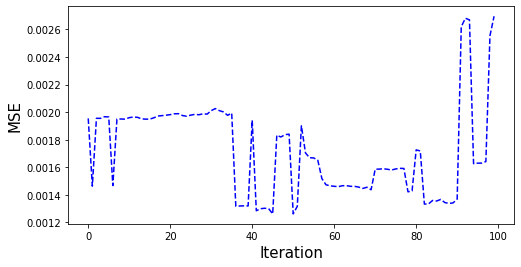

0.0012611296


In [ ]:
plot_graph(validation_MSE, 'MSE', 'Iteration', 'b')
print(np.min(validation_MSE))

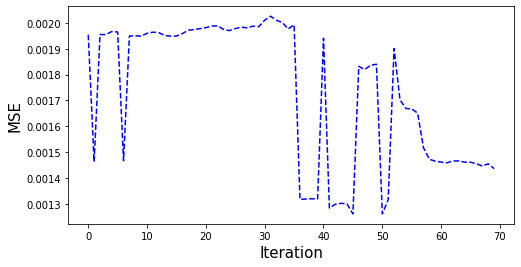

0.0012611296


In [ ]:
plot_graph(validation_MSE[:70], 'MSE', 'Iteration', 'b')
print(np.min(validation_MSE))

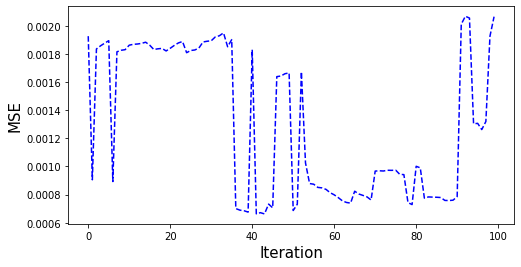

0.00066246866


In [ ]:
plot_graph(test_1_MSE, 'MSE', 'Iteration', 'b')
print(np.min(test_1_MSE))

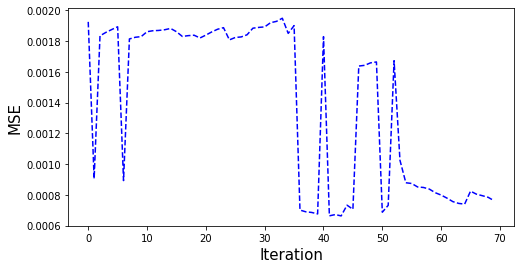

0.00066246866


In [ ]:
plot_graph(test_1_MSE[:70], 'MSE', 'Iteration', 'b')
print(np.min(test_1_MSE))

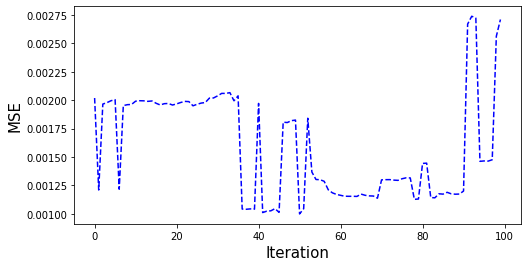

0.0009980437


In [ ]:
plot_graph(test_2_MSE, 'MSE', 'Iteration', 'b')
print(np.min(test_2_MSE))

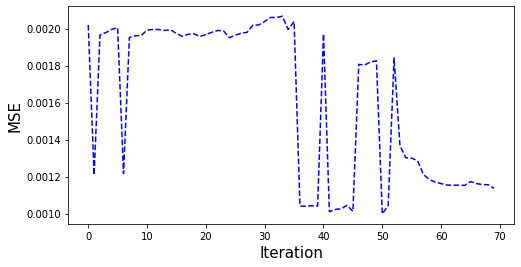

0.0009980437


In [ ]:
plot_graph(test_2_MSE[:70], 'MSE', 'Iteration', 'b')
print(np.min(test_2_MSE))

In [ ]:
tf.keras.backend.clear_session()

simple_model = Sequential()

simple_model.add(Dense(units=32, input_dim=10, activation='relu'))
simple_model.add(Dense(8, activation='relu'))
simple_model.add(Dense(1))

simple_model.compile(loss='mean_squared_error', optimizer='adam', metrics = ['mse', 'mae'])

simple_model.set_weights(random_weights)

simple_model.fit(X_train,
                 y_train,
                 epochs=500,
                 validation_data=(X_validation, y_validation),
                 callbacks=[early_stop_callback],
                 shuffle=False)

Epoch 1/500
39/39 [==============================] - 1s 6ms/step - loss: 70652.4609 - mse: 70652.4609 - mae: 256.6885 - val_loss: 56679.7109 - val_mse: 56679.7109 - val_mae: 236.1923
Epoch 2/500
39/39 [==============================] - 0s 3ms/step - loss: 46544.8984 - mse: 46544.8984 - mae: 208.2713 - val_loss: 38397.4766 - val_mse: 38397.4766 - val_mae: 194.4026
Epoch 3/500
39/39 [==============================] - 0s 3ms/step - loss: 32252.5918 - mse: 32252.5918 - mae: 173.3293 - val_loss: 27142.9922 - val_mse: 27142.9922 - val_mae: 163.4474
Epoch 4/500
39/39 [==============================] - 0s 2ms/step - loss: 23173.6328 - mse: 23173.6328 - mae: 146.8951 - val_loss: 19788.1738 - val_mse: 19788.1738 - val_mae: 139.5566
Epoch 5/500
39/39 [==============================] - 0s 3ms/step - loss: 17102.6309 - mse: 17102.6309 - mae: 126.1767 - val_loss: 14767.9355 - val_mse: 14767.9355 - val_mae: 120.5606
Epoch 6/500
39/39 [==============================] - 0s 2ms/step - loss: 12886.8340 -

In [ ]:
simple_model_pred_validation = simple_model.predict(X_validation)
print(mean_squared_error(y_validation, simple_model_pred_validation))

0.0019553937


In [ ]:
simple_model_pred_test_1 = simple_model.predict(X_test_1)
print(mean_squared_error(y_test_1, simple_model_pred_test_1))

0.0019167335


In [ ]:
simple_model_pred_test_2 = simple_model.predict(X_test_2)
print(mean_squared_error(y_test_2, simple_model_pred_test_2))

0.002014489


In [ ]:
improved_model = get_model()

for i in range(len(improved_model.layers)):
  improved_model.layers[i].set_weights(best_model_weights[i])

improved_model_pred_validation = improved_model.predict(X_validation)
print(mean_squared_error(y_validation, improved_model_pred_validation))

0.0012611296


In [ ]:
improved_model_pred_test_1 = improved_model.predict(X_test_1)
print(mean_squared_error(y_test_1, improved_model_pred_test_1))

0.00068670354


In [ ]:
improved_model_pred_test_2 = improved_model.predict(X_test_2)
print(mean_squared_error(y_test_2, improved_model_pred_test_2))

0.0009980437
